<a href="https://colab.research.google.com/github/NikoriakViktot/Data_Science_Course_SSWU/blob/main/WS1_Regression_Nikoriak.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Інформація про датасет

**Інформація про набір даних:**<br>
Набір даних містить 9358 усереднених за годину відповідей від масиву з 5 хімічних датчиків оксиду металу, вбудованих у хімічний мультисенсорний пристрій якості повітря. Апарат був розташований на полі в сильно забрудненому районі, на рівні дороги, в межах італійського міста. Дані були записані з березня 2004 р. по лютий 2005 р. (один рік), що представляє собою найдовші доступні у вільному доступі записи відповідей хімічних датчиків якості повітря, розміщених у полі. Ground Truth усереднені за годину концентрації CO, неметанових вуглеводнів, бензолу, загальних оксидів азоту (NOx) і діоксиду азоту (NO2) були надані суміжним еталонним сертифікованим аналізатором. <br>Відсутні значення позначено значенням -200.<br>
Інформація про атрибути:<br>

0. Date - Дата (ДД/ММ/РРРР)
1. Time - Час (ГГ.ХХ.СС)
2. CO(GT) Справжня середньогодинна концентрація СО в мг/м^3 (еталонний аналізатор)
3. PT08.S1 (оксид олова) усереднена за годину відповідь датчика (номінально цільовий CO)
4. NMHC(GT) - Справжня середньогодинна загальна концентрація неметанових вуглеводнів у мкг/м^3 (еталонний аналізатор)
5. C6H6(GT) - Справжня середньогодинна концентрація бензолу в мкг/м^3 (еталонний аналізатор)
6. PT08.S2 (titania) усереднена за годину відповідь датчика (номінально націлений NMHC)
7. NOx(GT) - Справжня середньогодинна концентрація NOx в ppb (еталонний аналізатор)
8. PT08.S3 (оксид вольфраму) погодинна усереднена відповідь датчика (номінально цільовий NOx)
9. NO2(GT) - Справжня середньогодинна концентрація NO2 в мкг/м^3 (еталонний аналізатор)
10. PT08.S4 (оксид вольфраму) погодинна усереднена відповідь датчика (номінально націлений NO2)
11. PT08.S5 (оксид індію) усереднена за годину відповідь датчика (номінально цільовий O3)
12. T - Температура в °C
13. RH - Відносна вологість (%)
14. AH - Абсолютна вологість



# Ініціалізація середовища

In [ ]:
# !pip install regressors

In [ ]:
# init environment
from io import BytesIO
from zipfile import ZipFile
from urllib.request import urlopen

import numpy as np
import pandas as pd
import scipy.stats as st
import math
import matplotlib.text as plttxt

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
plt.style.use('bmh')

from dateutil import parser

from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from sklearn.linear_model import BayesianRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score

from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.model_selection import train_test_split
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.metrics import r2_score

from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import RepeatedKFold, cross_validate
from sklearn.compose import TransformedTargetRegressor, make_column_transformer
from sklearn.metrics import PredictionErrorDisplay, median_absolute_error, mean_absolute_error
import scipy as sp
from sklearn.linear_model import RidgeCV, LassoCV
# from regressors.stats import coef_pval
%matplotlib inline

# Зчитування і форматування даних

In [ ]:

file_url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/00360/AirQualityUCI.zip'
resp = urlopen(file_url)
zipfile = ZipFile(BytesIO(resp.read()))
data = zipfile.open('AirQualityUCI.csv')
df = pd.read_csv(data, sep=';')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df.head(3)

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004,18.00.00,"2,6",1360.0,150.0,"11,9",1046.0,166.0,1056.0,113.0,1692.0,1268.0,"13,6","48,9","0,7578",NaN,NaN
1,10/03/2004,19.00.00,2,1292.0,112.0,"9,4",955.0,103.0,1174.0,92.0,1559.0,972.0,"13,3","47,7","0,7255",NaN,NaN
2,10/03/2004,20.00.00,"2,2",1402.0,88.0,"9,0",939.0,131.0,1140.0,114.0,1555.0,1074.0,"11,9","54,0","0,7502",NaN,NaN


In [ ]:
# check empty rows and drop them
print('Initial shape: ' + str(df.shape))
print(df[df['Date'].isnull()])
df.dropna(how='all', inplace=True)
print('Result shape: ' + str(df.shape))

Initial shape: (9471, 17)
     Date Time CO(GT)  PT08.S1(CO)  NMHC(GT) C6H6(GT)  PT08.S2(NMHC)  NOx(GT)  \
9357  NaN  NaN    NaN          NaN       NaN      NaN            NaN      NaN   
9358  NaN  NaN    NaN          NaN       NaN      NaN            NaN      NaN   
9359  NaN  NaN    NaN          NaN       NaN      NaN            NaN      NaN   
9360  NaN  NaN    NaN          NaN       NaN      NaN            NaN      NaN   
9361  NaN  NaN    NaN          NaN       NaN      NaN            NaN      NaN   
...   ...  ...    ...          ...       ...      ...            ...      ...   
9466  NaN  NaN    NaN          NaN       NaN      NaN            NaN      NaN   
9467  NaN  NaN    NaN          NaN       NaN      NaN            NaN      NaN   
9468  NaN  NaN    NaN          NaN       NaN      NaN            NaN      NaN   
9469  NaN  NaN    NaN          NaN       NaN      NaN            NaN      NaN   
9470  NaN  NaN    NaN          NaN       NaN      NaN            NaN      NaN   

 

In [ ]:
# check if the last 2 columns has values
[df['Unnamed: 16'].unique(),  df['Unnamed: 16'].unique()]

[array([nan]), array([nan])]

In [ ]:
# drop last 2 columns
df.drop(['Unnamed: 15', 'Unnamed: 16'], axis=1, inplace=True)
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18.00.00,"2,6",1360.0,150.0,"11,9",1046.0,166.0,1056.0,113.0,1692.0,1268.0,"13,6","48,9","0,7578"
1,10/03/2004,19.00.00,2,1292.0,112.0,"9,4",955.0,103.0,1174.0,92.0,1559.0,972.0,"13,3","47,7","0,7255"
2,10/03/2004,20.00.00,"2,2",1402.0,88.0,"9,0",939.0,131.0,1140.0,114.0,1555.0,1074.0,"11,9","54,0","0,7502"
3,10/03/2004,21.00.00,"2,2",1376.0,80.0,"9,2",948.0,172.0,1092.0,122.0,1584.0,1203.0,"11,0","60,0","0,7867"
4,10/03/2004,22.00.00,"1,6",1272.0,51.0,"6,5",836.0,131.0,1205.0,116.0,1490.0,1110.0,"11,2","59,6","0,7888"


In [ ]:
# check data
df.dtypes

,0
Date,object
Time,object
CO(GT),object
PT08.S1(CO),float64
NMHC(GT),float64
C6H6(GT),object
PT08.S2(NMHC),float64
NOx(GT),float64
PT08.S3(NOx),float64
NO2(GT),float64


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9357 entries, 0 to 9356
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         9357 non-null   object 
 3   PT08.S1(CO)    9357 non-null   float64
 4   NMHC(GT)       9357 non-null   float64
 5   C6H6(GT)       9357 non-null   object 
 6   PT08.S2(NMHC)  9357 non-null   float64
 7   NOx(GT)        9357 non-null   float64
 8   PT08.S3(NOx)   9357 non-null   float64
 9   NO2(GT)        9357 non-null   float64
 10  PT08.S4(NO2)   9357 non-null   float64
 11  PT08.S5(O3)    9357 non-null   float64
 12  T              9357 non-null   object 
 13  RH             9357 non-null   object 
 14  AH             9357 non-null   object 
dtypes: float64(8), object(7)
memory usage: 1.1+ MB


Як бачимо частина параметрів, що мала б бути числовими, такими не є. Виправимо це.

In [ ]:
df['DateTime'] = (df['Date'] + ' ' + df['Time'].str.replace('.', ':')).map(parser.parse)
df['Date'] = df['Date'].map(parser.parse)
df['Hour'] = df['Time'].map(lambda x: int(x[0:2]))
df['C6H6(GT)'] = df['C6H6(GT)'].map(lambda x: float(x.replace(',','.')))
df['CO(GT)'] = df['CO(GT)'].map(lambda x: float(x.replace(',','.')))
df['T'] = df['T'].map(lambda x: float(x.replace(',','.')))
df['RH'] = df['RH'].map(lambda x: float(x.replace(',','.')))
df['AH'] = df['AH'].map(lambda x: float(x.replace(',','.')))

In [ ]:
df.dtypes

,0
Date,datetime64[ns]
Time,object
CO(GT),float64
PT08.S1(CO),float64
NMHC(GT),float64
C6H6(GT),float64
PT08.S2(NMHC),float64
NOx(GT),float64
PT08.S3(NOx),float64
NO2(GT),float64


In [ ]:
df.dtypes

,0
Date,datetime64[ns]
Time,object
CO(GT),float64
PT08.S1(CO),float64
NMHC(GT),float64
C6H6(GT),float64
PT08.S2(NMHC),float64
NOx(GT),float64
PT08.S3(NOx),float64
NO2(GT),float64


Перевіримо основні статистики данних

In [ ]:
df.describe(include='all')

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime,Hour
count,9357,9357,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357,9357.000000
unique,NaN,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,18.00.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,390,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2004-09-22 02:49:54.036550272,NaN,-34.207524,1048.990061,-159.090093,1.865683,894.595276,168.616971,794.990168,58.148873,1391.479641,975.072032,9.778305,39.485380,-6.837604,2004-09-22 14:19:48.842577792,11.498557
min,2004-01-04 00:00:00,NaN,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,2004-01-04 00:00:00,0.000000
25%,2004-05-28 00:00:00,NaN,0.600000,921.000000,-200.000000,4.000000,711.000000,50.000000,637.000000,53.000000,1185.000000,700.000000,10.900000,34.100000,0.692300,2004-05-28 11:00:00,5.000000
50%,2004-09-14 00:00:00,NaN,1.500000,1053.000000,-200.000000,7.900000,895.000000,141.000000,794.000000,96.000000,1446.000000,942.000000,17.200000,48.600000,0.976800,2004-09-14 22:00:00,11.000000
75%,2004-12-28 00:00:00,NaN,2.600000,1221.000000,-200.000000,13.600000,1105.000000,284.000000,960.000000,133.000000,1662.000000,1255.000000,24.100000,61.900000,1.296200,2004-12-28 03:00:00,18.000000
max,2005-12-03 00:00:00,NaN,11.900000,2040.000000,1189.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000,2005-12-03 23:00:00,23.000000


За умовою, значення -200 - це пропущенні значення. Замінимо їх на nan

In [ ]:
df.replace(-200, np.nan, inplace=True)

Перевіримо описові статистики

In [ ]:
df.describe()

,Date,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime,Hour
count,9357,7674.000000,8991.000000,914.000000,8991.000000,8991.000000,7718.000000,8991.000000,7715.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,9357,9357.000000
mean,2004-09-22 02:49:54.036550272,2.152750,1099.833166,218.811816,10.083105,939.153376,246.896735,835.493605,113.091251,1456.264598,1022.906128,18.317829,49.234201,1.025530,2004-09-22 14:19:48.842577792,11.498557
min,2004-01-04 00:00:00,0.100000,647.000000,7.000000,0.100000,383.000000,2.000000,322.000000,2.000000,551.000000,221.000000,-1.900000,9.200000,0.184700,2004-01-04 00:00:00,0.000000
25%,2004-05-28 00:00:00,1.100000,937.000000,67.000000,4.400000,734.500000,98.000000,658.000000,78.000000,1227.000000,731.500000,11.800000,35.800000,0.736800,2004-05-28 11:00:00,5.000000
50%,2004-09-14 00:00:00,1.800000,1063.000000,150.000000,8.200000,909.000000,180.000000,806.000000,109.000000,1463.000000,963.000000,17.800000,49.600000,0.995400,2004-09-14 22:00:00,11.000000
75%,2004-12-28 00:00:00,2.900000,1231.000000,297.000000,14.000000,1116.000000,326.000000,969.500000,142.000000,1674.000000,1273.500000,24.400000,62.500000,1.313700,2004-12-28 03:00:00,18.000000
max,2005-12-03 00:00:00,11.900000,2040.000000,1189.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000,2005-12-03 23:00:00,23.000000
std,NaN,1.453252,217.080037,204.459921,7.449820,266.831429,212.979168,256.817320,48.370108,346.206794,398.484288,8.832116,17.316892,0.403813,NaN,6.923182


Перевіримо чи є порожні рядки (крім поля Hour)

In [ ]:
df.dropna(thresh=5, inplace=True)
df.describe()

,Date,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime,Hour
count,9326,7674.000000,8991.000000,914.000000,8991.000000,8991.000000,7718.000000,8991.000000,7715.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,9326,9326.000000
mean,2004-09-22 09:08:45.755951104,2.152750,1099.833166,218.811816,10.083105,939.153376,246.896735,835.493605,113.091251,1456.264598,1022.906128,18.317829,49.234201,1.025530,2004-09-22 20:39:05.828865664,11.505576
min,2004-01-04 00:00:00,0.100000,647.000000,7.000000,0.100000,383.000000,2.000000,322.000000,2.000000,551.000000,221.000000,-1.900000,9.200000,0.184700,2004-01-04 00:00:00,0.000000
25%,2004-05-28 00:00:00,1.100000,937.000000,67.000000,4.400000,734.500000,98.000000,658.000000,78.000000,1227.000000,731.500000,11.800000,35.800000,0.736800,2004-05-28 17:15:00,6.000000
50%,2004-09-15 00:00:00,1.800000,1063.000000,150.000000,8.200000,909.000000,180.000000,806.000000,109.000000,1463.000000,963.000000,17.800000,49.600000,0.995400,2004-09-15 13:30:00,12.000000
75%,2004-12-28 00:00:00,2.900000,1231.000000,297.000000,14.000000,1116.000000,326.000000,969.500000,142.000000,1674.000000,1273.500000,24.400000,62.500000,1.313700,2004-12-28 10:45:00,18.000000
max,2005-12-03 00:00:00,11.900000,2040.000000,1189.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000,2005-12-03 23:00:00,23.000000
std,NaN,1.453252,217.080037,204.459921,7.449820,266.831429,212.979168,256.817320,48.370108,346.206794,398.484288,8.832116,17.316892,0.403813,NaN,6.920980


In [ ]:
df.columns

Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH', 'DateTime', 'Hour'],
      dtype='object')

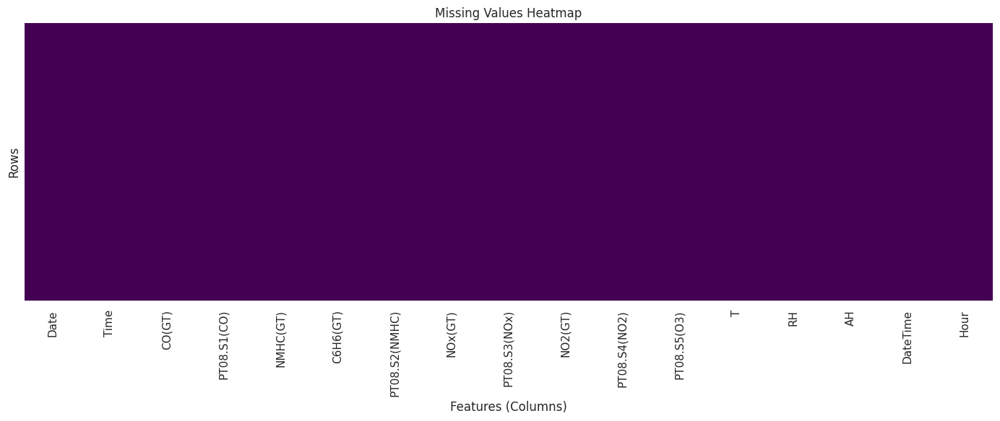

In [ ]:

plt.figure(figsize=(14, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis', yticklabels=False)
plt.title("Missing Values Heatmap")
plt.xlabel("Features (Columns)")
plt.ylabel("Rows")
plt.tight_layout()
plt.show()


На графіку показано наявність пропущених значень (NaN) у кожному стовпці  датасету.
Жовті лінії позначають місця, де значення відсутні, а фіолетові — де значення є.
 Основні спостереження:
Колонка NMHC(GT) має найбільше пропусків (~90%), що видно як суцільна жовта смуга → її слід видалити, оскільки вона майже не містить корисної інформації.

Інші колонки, зокрема CO(GT), NOx(GT), NO2(GT) — мають помірну кількість пропусків (~17–18%), але вони містять важливу інформацію і можуть бути заповнені (імпутовані) медіаною.

Деякі сенсорні дані (PT08.*) і метеопараметри (T, RH, AH) мають незначні пропуски (~3.5%) → не критично, легко обробляється.

Графік допоміг визначити колонки, які варто видалити або обробити, щоб підвищити якість даних перед побудовою моделі.
Це важливий етап у процесі підготовки даних (data preprocessing), оскільки моделі машинного навчання не працюють із NaN без попередньої обробки.

In [ ]:
df.isnull().sum().sort_values(ascending=False)

,0
NMHC(GT),8412
CO(GT),1652
NO2(GT),1611
NOx(GT),1608
RH,335
PT08.S2(NMHC),335
C6H6(GT),335
PT08.S3(NOx),335
PT08.S1(CO),335
AH,335


Перевіримо розподіли

/usr/local/lib/python3.11/dist-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)


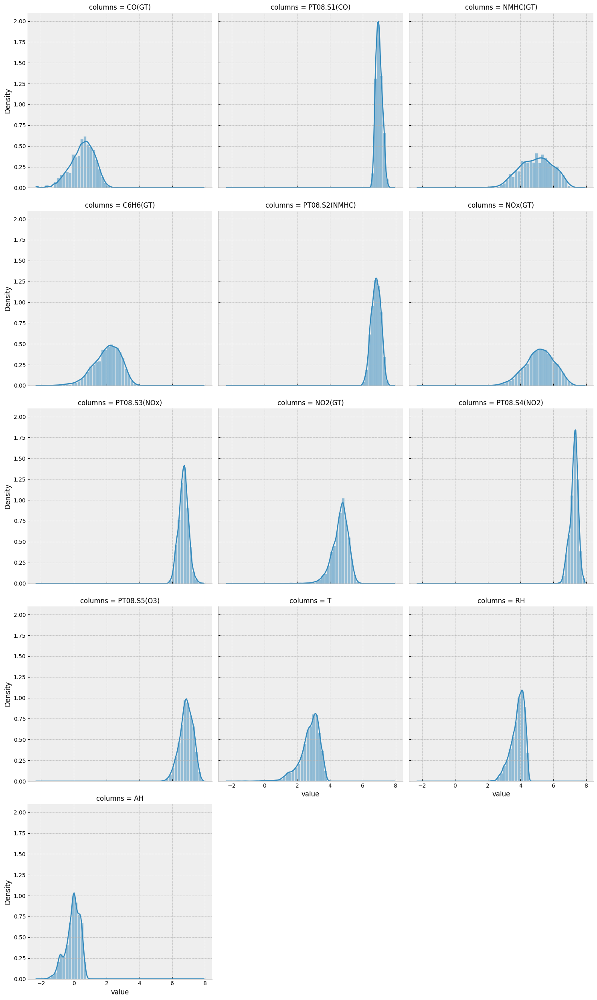

In [ ]:
dfm = np.log(df.iloc[:, 2:15]).melt(var_name='columns')
g = sns.displot(data=dfm, x='value', col='columns', col_wrap=3, common_norm=False, kde=True, stat='density')

Ці графіки показали, що деякі ознаки мають скошений розподіл, а отже:

Необхідно логарифмувати або нормалізувати деякі змінні (особливо цільову: C6H6(GT))

Викиди є, але масштаб не критичний

Сенсори (PT08.S*) добре підходять до моделі, бо мають стабільні розподіли

Графіки допомагають приймати рішення про попередню обробку (preprocessing)

In [ ]:
df["CO(GT)"] = df["CO(GT)"].fillna(df["CO(GT)"].median())

In [ ]:
X = df.iloc[:, 2:15]
print(X.info())
imputer = SimpleImputer(missing_values=np.nan, strategy='median')
imputer = imputer.fit(X)

X = imputer.transform(X)
df.iloc[:, 2:15] = X
df.describe()

<class 'pandas.core.frame.DataFrame'>
Index: 9326 entries, 0 to 9356
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CO(GT)         9326 non-null   float64
 1   PT08.S1(CO)    9326 non-null   float64
 2   NMHC(GT)       9326 non-null   float64
 3   C6H6(GT)       9326 non-null   float64
 4   PT08.S2(NMHC)  9326 non-null   float64
 5   NOx(GT)        9326 non-null   float64
 6   PT08.S3(NOx)   9326 non-null   float64
 7   NO2(GT)        9326 non-null   float64
 8   PT08.S4(NO2)   9326 non-null   float64
 9   PT08.S5(O3)    9326 non-null   float64
 10  T              9326 non-null   float64
 11  RH             9326 non-null   float64
 12  AH             9326 non-null   float64
dtypes: float64(13)
memory usage: 1020.0 KB
None


,Date,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime,Hour
count,9326,9326.000000,9326.000000,9326.000000,9326.000000,9326.000000,9326.00000,9326.000000,9326.000000,9326.000000,9326.000000,9326.000000,9326.000000,9326.000000,9326,9326.000000
mean,2004-09-22 09:08:45.755951104,2.090264,1098.510079,156.743942,10.015462,938.070234,235.36232,834.434163,112.384516,1456.506541,1020.754235,18.299228,49.247341,1.024448,2004-09-22 20:39:05.828865664,11.505576
min,2004-01-04 00:00:00,0.100000,647.000000,7.000000,0.100000,383.000000,2.00000,322.000000,2.000000,551.000000,221.000000,-1.900000,9.200000,0.184700,2004-01-04 00:00:00,0.000000
25%,2004-05-28 00:00:00,1.200000,941.000000,150.000000,4.600000,742.000000,112.00000,665.000000,85.000000,1241.000000,741.000000,12.000000,36.500000,0.745500,2004-05-28 17:15:00,6.000000
50%,2004-09-15 00:00:00,1.800000,1063.000000,150.000000,8.200000,909.000000,180.00000,806.000000,109.000000,1463.000000,963.000000,17.800000,49.600000,0.995400,2004-09-15 13:30:00,12.000000
75%,2004-12-28 00:00:00,2.600000,1222.000000,150.000000,13.700000,1106.000000,285.00000,961.000000,133.000000,1662.750000,1257.000000,24.100000,61.900000,1.298625,2004-12-28 10:45:00,18.000000
max,2005-12-03 00:00:00,11.900000,2040.000000,1189.000000,63.700000,2214.000000,1479.00000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000,2005-12-03 23:00:00,23.000000
std,NaN,1.325116,213.255277,67.168405,7.323169,262.054731,195.38905,252.221787,44.021078,339.933498,391.419866,8.672554,17.003130,0.396532,NaN,6.920980


заповнен відсутні значення в основних числових колонках за допомогою медіани, оскільки деякі змінні мають асиметричний розподіл (наприклад, CO(GT), NOx(GT)).
Медіана менш чутлива до викидів, ніж середнє, тому це дозволяє зберегти достовірність даних перед моделюванням.
Після заповнення всі колонки мають однакову кількість рядків (count = 9326), що означає, що набір готовий до аналізу та побудови моделей.

/usr/local/lib/python3.11/dist-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)


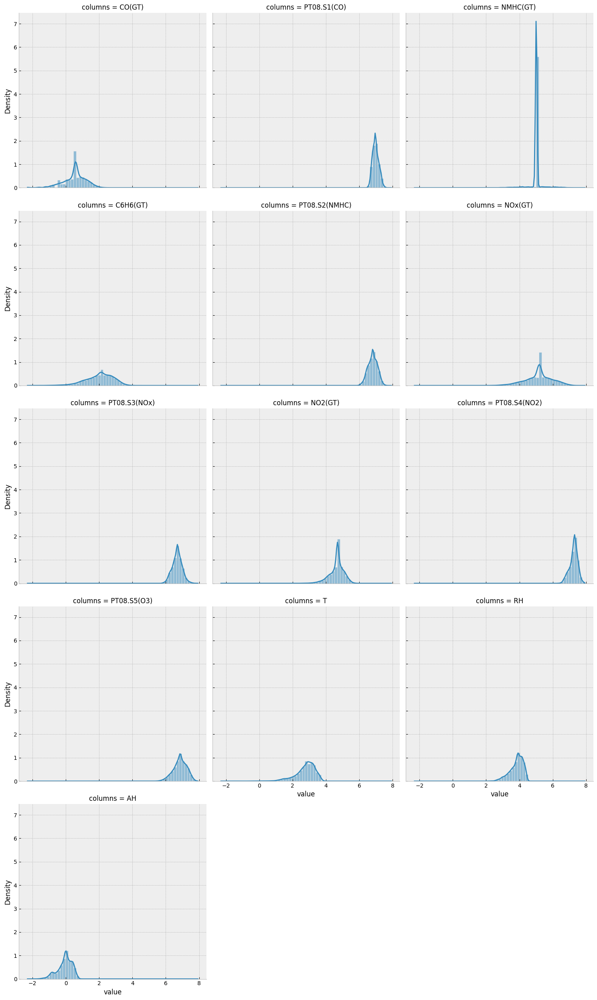

In [ ]:
dfm = np.log(df.iloc[:, 2:15]).melt(var_name='columns')
g = sns.displot(data=dfm, x='value', col='columns', col_wrap=3, common_norm=False, kde=True, stat='density')

Для покращення статистичних властивостей ознак було застосовано логарифмічне перетворення числових змінних.
Це дозволяє зменшити асиметрію розподілу, знизити вплив викидів та стабілізувати дисперсію, що в свою чергу сприяє покращенню якості побудови регресійних моделей і алгоритмів машинного навчання.

In [ ]:
df.dtypes

,0
Date,datetime64[ns]
Time,object
CO(GT),float64
PT08.S1(CO),float64
NMHC(GT),float64
C6H6(GT),float64
PT08.S2(NMHC),float64
NOx(GT),float64
PT08.S3(NOx),float64
NO2(GT),float64


In [ ]:
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime,Hour
0,2004-10-03,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,2004-10-03 18:00:00,18
1,2004-10-03,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,2004-10-03 19:00:00,19
2,2004-10-03,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,2004-10-03 20:00:00,20
3,2004-10-03,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,2004-10-03 21:00:00,21
4,2004-10-03,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,2004-10-03 22:00:00,22


# EDA

Визначемо цільовий та вхідні параметри. Цільовий C6H6(GT).

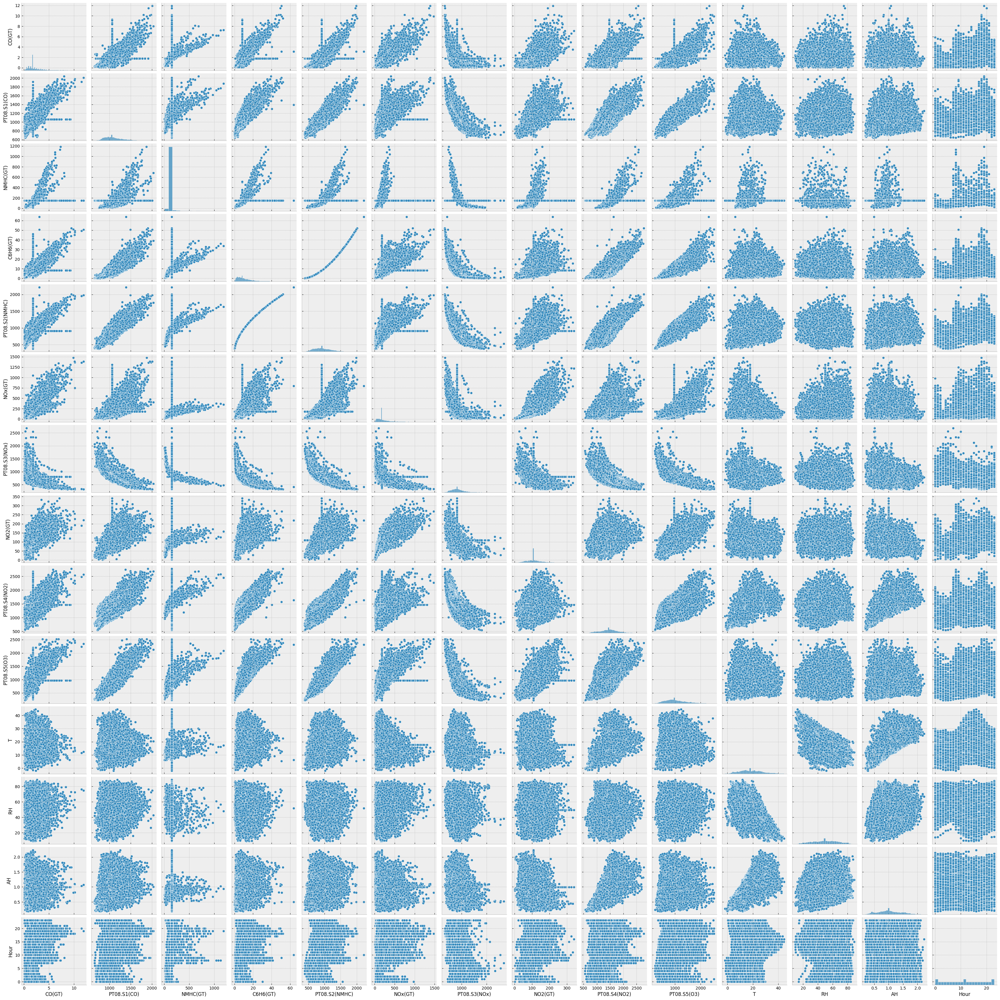

In [ ]:
sns.pairplot(df)

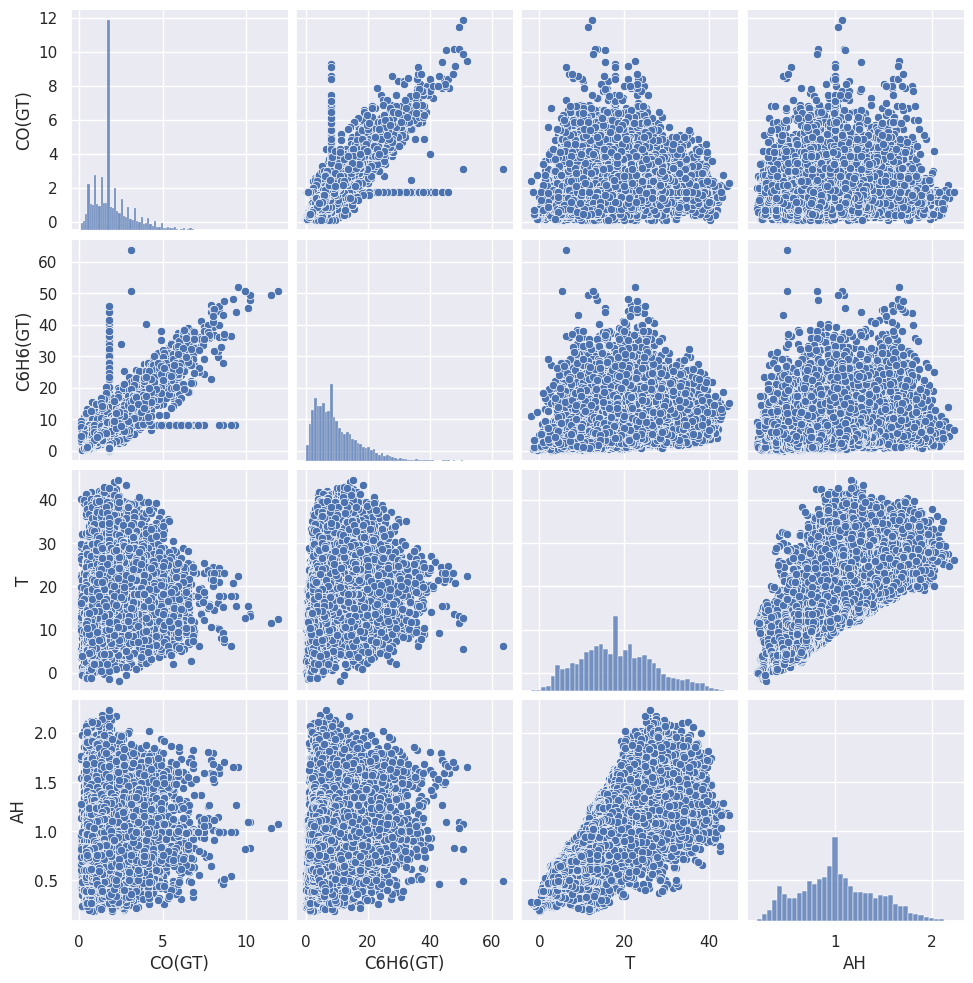

In [ ]:
sns.pairplot(df[["CO(GT)", "C6H6(GT)", "T", "AH"]])


Для первинного аналізу було побудовано матрицю парних діаграм (pairplot) для основних змінних: CO(GT), C6H6(GT), температура (T) та відносна вологість (RH). Такий графік дозволяє візуально оцінити розподіли ознак та зв’язки між ними.

Основні спостереження:
Сильна позитивна кореляція між CO(GT) і C6H6(GT). Зі збільшенням концентрації оксиду вуглецю спостерігається зростання концентрації бензолу. Це може свідчити про спільне джерело забруднення, наприклад, транспорт.

Розподіли CO(GT) і C6H6(GT) скошені вправо — більшість значень зосереджена в нижньому діапазоні, з наявністю окремих високих значень (викидів).

Температура (T) і відносна вологість (RH) мають більш симетричні розподіли, що наближаються до нормальних.

Негативна залежність між температурою і вологістю: зі зростанням температури відносна вологість зменшується, що узгоджується з фізичними закономірностями атмосферних процесів.

Відсутність вираженої кореляції між CO(GT), C6H6(GT) та температурою або вологістю.

Висновок:
Отримані результати допомагають виділити змінні, які потенційно важливі для побудови моделей, а також звернути увагу на можливу мультиколінеарність, зокрема між CO та C6H6. Це слід враховувати при виборі ознак і типу моделі.

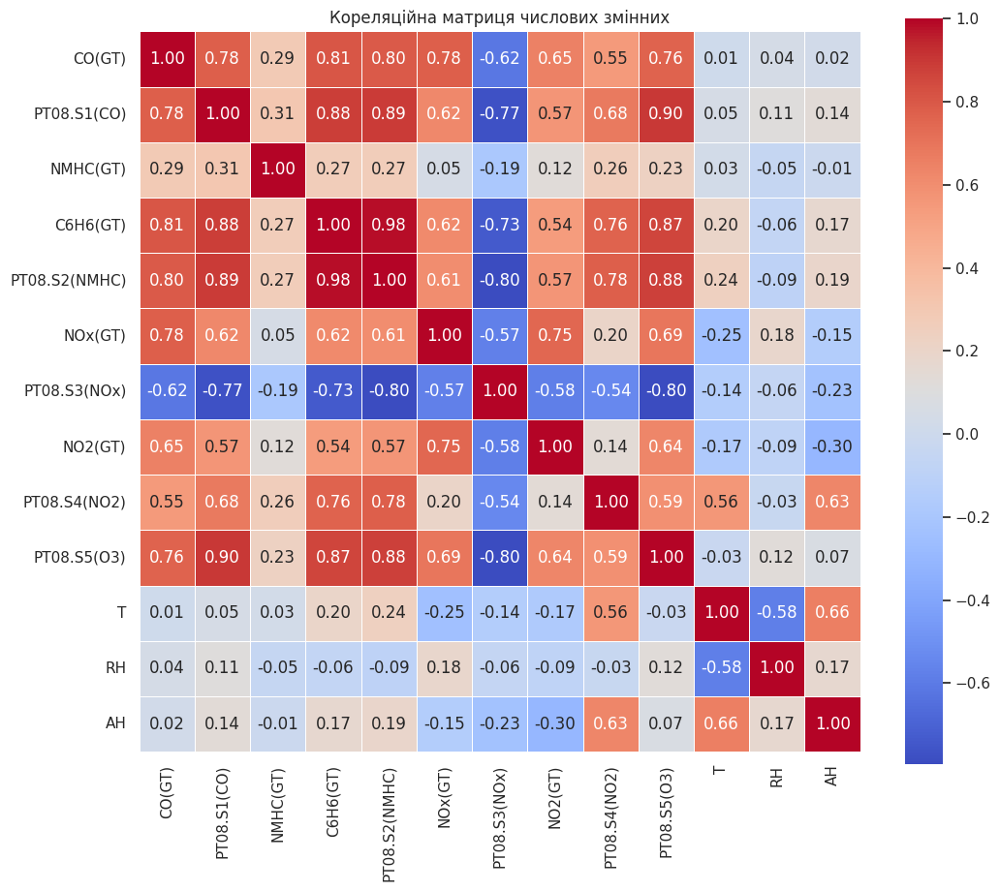

In [ ]:
# Створення кореляційної матриці для числових ознак
corr_matrix = df.iloc[:, 2:15].corr()

# Побудова теплової карти
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True, linewidths=0.5)
plt.title("Кореляційна матриця числових змінних")
plt.show()


### Кореляційний аналіз змінних

Побудувана кореляційна матриця для числових змінних, виділено найбільш корельовані пари. Це дозволяє:

-  **Виявити сильні зв’язки між ознаками**;
-  **Зменшити кількість зайвих (схожих) змінних**;
-  **Підвищити якість моделі, уникнувши мультиколінеарності**.

---

####  Найсильніші корельовані пари:

| Змінна 1         | Змінна 2          | Кореляція |
|------------------|-------------------|------------|
| C6H6(GT)         | PT08.S2(NMHC)     | **0.98**   |
| PT08.S1(CO)      | PT08.S2(NMHC)     | **0.89**   |
| C6H6(GT)         | PT08.S5(O3)       | **0.87**   |
| CO(GT)           | C6H6(GT)          | **0.81**   |
| PT08.S3(NOx)     | PT08.S5(O3)       | **-0.80**  |

---

###  Висновок:

Цей аналіз допомагає відібрати **найінформативніші ознаки** та **уникнути дублювання змінних**, що важливо для побудови ефективної моделі.


Text(0.5, 1.0, 'The relationship between CO(GT) x, C6H6(GT) y')

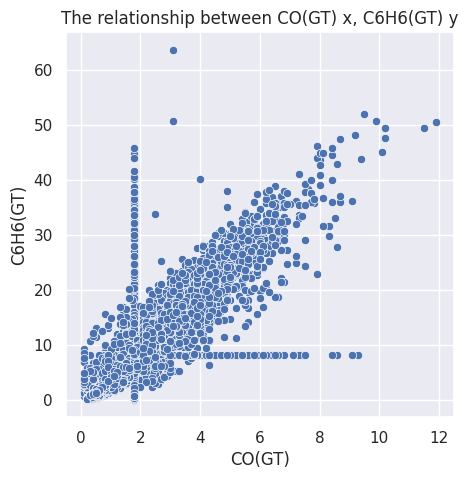

In [ ]:
sns.set(rc={'figure.figsize':(5,5)})
plot_co = sns.scatterplot(data=df.loc[:, ['CO(GT)', 'C6H6(GT)']],
                          x='CO(GT)',
                          y='C6H6(GT)')
plot_co.set_title('The relationship between CO(GT) x, C6H6(GT) y')

44.02107845608059


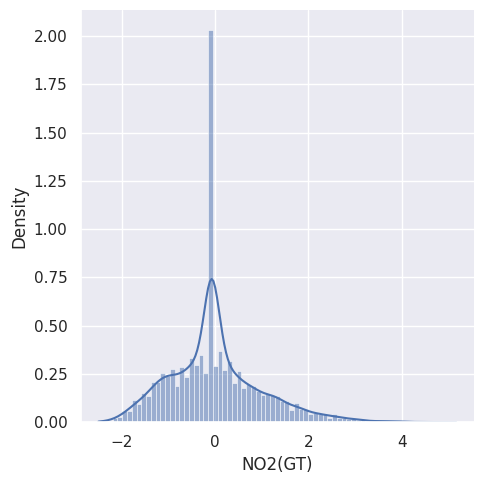

In [ ]:
colname="NO2(GT)"
col_sd = df[colname].std()
col_mean = df[colname].mean()
x = (df[colname] - col_mean)/col_sd
print(col_sd)
sns.displot(x=x, kde=True, stat='density', )

In [ ]:
df[x > 4]

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime,Hour
7911,2005-03-02,09.00.00,5.6,1544.0,150.0,29.1,1530.0,975.0,416.0,309.0,1706.0,2030.0,2.1,62.2,0.4491,2005-03-02 09:00:00,9
7912,2005-03-02,10.00.00,4.9,1429.0,150.0,20.7,1317.0,947.0,495.0,322.0,1425.0,1916.0,5.1,50.8,0.4499,2005-03-02 10:00:00,10
7913,2005-03-02,11.00.00,3.5,1312.0,150.0,15.5,1164.0,790.0,570.0,333.0,1230.0,1761.0,8.5,39.7,0.4425,2005-03-02 11:00:00,11
7934,2005-04-02,08.00.00,4.0,1411.0,150.0,19.7,1288.0,887.0,492.0,306.0,1472.0,1638.0,2.3,70.9,0.5182,2005-04-02 08:00:00,8
7935,2005-04-02,09.00.00,3.9,1328.0,150.0,20.1,1300.0,654.0,499.0,301.0,1405.0,1672.0,4.4,61.1,0.5176,2005-04-02 09:00:00,9
7959,2005-05-02,09.00.00,4.1,1165.0,150.0,11.3,1024.0,759.0,646.0,310.0,1134.0,1365.0,4.1,52.7,0.4345,2005-05-02 09:00:00,9
8079,2005-10-02,09.00.00,3.8,1063.0,150.0,8.2,909.0,540.0,806.0,289.0,1463.0,963.0,17.8,49.6,0.9954,2005-10-02 09:00:00,9
8103,2005-11-02,09.00.00,5.9,1063.0,150.0,8.2,909.0,700.0,806.0,296.0,1463.0,963.0,17.8,49.6,0.9954,2005-11-02 09:00:00,9
8104,2005-11-02,10.00.00,5.4,1063.0,150.0,8.2,909.0,747.0,806.0,291.0,1463.0,963.0,17.8,49.6,0.9954,2005-11-02 10:00:00,10
8109,2005-11-02,15.00.00,6.1,1063.0,150.0,8.2,909.0,1054.0,806.0,312.0,1463.0,963.0,17.8,49.6,0.9954,2005-11-02 15:00:00,15


In [ ]:
quantile = df[colname].quantile([0.75])
df.loc[x > 4, [colname]] = quantile.iloc[0]

In [ ]:
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime,Hour
0,2004-10-03,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,2004-10-03 18:00:00,18
1,2004-10-03,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,2004-10-03 19:00:00,19
2,2004-10-03,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,2004-10-03 20:00:00,20
3,2004-10-03,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,2004-10-03 21:00:00,21
4,2004-10-03,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,2004-10-03 22:00:00,22


# Feature Engineering

Цікавий факт: PT08.S2(NMHC) має дуже сильний квадратичний або

---

експоненціальний звязок з C6H6(GT). <br>

<Axes: xlabel='PT08.S2(NMHC)', ylabel='C6H6(GT)'>

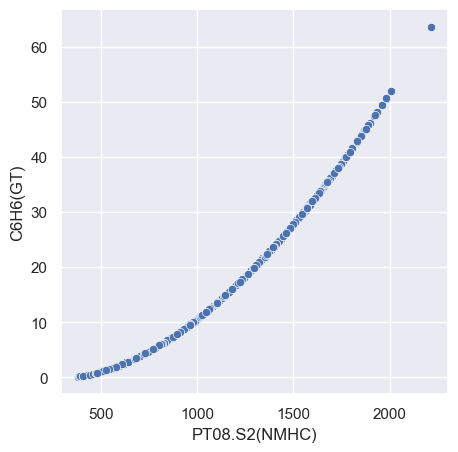

In [ ]:
sns.scatterplot(x = df['PT08.S2(NMHC)'], y = df['C6H6(GT)'])

<Axes: xlabel='PT08.S2(NMHC)', ylabel='C6H6(GT)'>

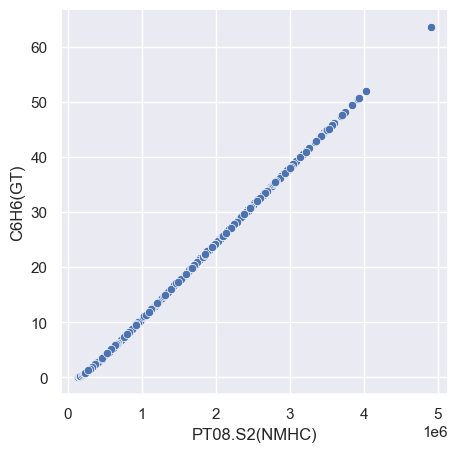

In [ ]:
sns.scatterplot(x = df['PT08.S2(NMHC)']**2, y = df['C6H6(GT)'])

Давайте перевіримо кореляцію Пірсона і її p-values для квадрату PT08.S2(NMHC) і C6H6(GT)

In [ ]:
st.pearsonr(df['PT08.S2(NMHC)']**2, df['C6H6(GT)'])

PearsonRResult(statistic=0.9997773201289891, pvalue=0.0)

Як бачимо, маємо майже лінійну залежність і p-value = 0, що означає, що цей звязок є значущим і лінійним. <br>
Згідно з вигомами відсутності мультиколінеарності ми не можемо використовувати квадрат PT08.S2(NMHC)<br>
В іншому випадку нам достатньо лише цього параметру, щоб прогнозувати C6H6(GT) чи наш y.

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

# Вибираємо тільки числові колонки
numeric_cols = df.select_dtypes(include=np.number).columns

# Порожній список для збереження результатів
results = []

# Перебираємо всі пари X і Y, де X ≠ Y
for col_x in numeric_cols:
    for col_y in numeric_cols:
        if col_x != col_y:
            x_squared = df[col_x] ** 2
            y = df[col_y]

            # Вилучаємо NaN
            mask = (~x_squared.isna()) & (~y.isna())
            if mask.sum() > 2:
                r, p = pearsonr(x_squared[mask], y[mask])
                results.append({
                    'X': col_x,
                    'Y': col_y,
                    'Corr(X², Y)': r,
                    'p-value': p
                })

# Перетворюємо в датафрейм
results_df = pd.DataFrame(results)


# Вивід результату
print(results_df.sort_values(by='Corr(X², Y)', ascending=False).head(10))


                 X              Y  Corr(X², Y)  p-value
55   PT08.S2(NMHC)       C6H6(GT)     0.999777      0.0
15     PT08.S1(CO)       C6H6(GT)     0.889321      0.0
21     PT08.S1(CO)    PT08.S5(O3)     0.889025      0.0
53   PT08.S2(NMHC)    PT08.S1(CO)     0.885931      0.0
118    PT08.S5(O3)    PT08.S1(CO)     0.882868      0.0
16     PT08.S1(CO)  PT08.S2(NMHC)     0.880625      0.0
60   PT08.S2(NMHC)    PT08.S5(O3)     0.868411      0.0
120    PT08.S5(O3)       C6H6(GT)     0.866977      0.0
121    PT08.S5(O3)  PT08.S2(NMHC)     0.850749      0.0
42        C6H6(GT)  PT08.S2(NMHC)     0.848610      0.0


Додамо день тижня

In [ ]:
results_df.sort_values(by='Corr(X², Y)', ascending=False).head(20)


,X,Y,"Corr(X², Y)",p-value
55,PT08.S2(NMHC),C6H6(GT),0.999777,0.0
15,PT08.S1(CO),C6H6(GT),0.889321,0.0
21,PT08.S1(CO),PT08.S5(O3),0.889025,0.0
53,PT08.S2(NMHC),PT08.S1(CO),0.885931,0.0
118,PT08.S5(O3),PT08.S1(CO),0.882868,0.0
16,PT08.S1(CO),PT08.S2(NMHC),0.880625,0.0
60,PT08.S2(NMHC),PT08.S5(O3),0.868411,0.0
120,PT08.S5(O3),C6H6(GT),0.866977,0.0
121,PT08.S5(O3),PT08.S2(NMHC),0.850749,0.0
42,C6H6(GT),PT08.S2(NMHC),0.848610,0.0


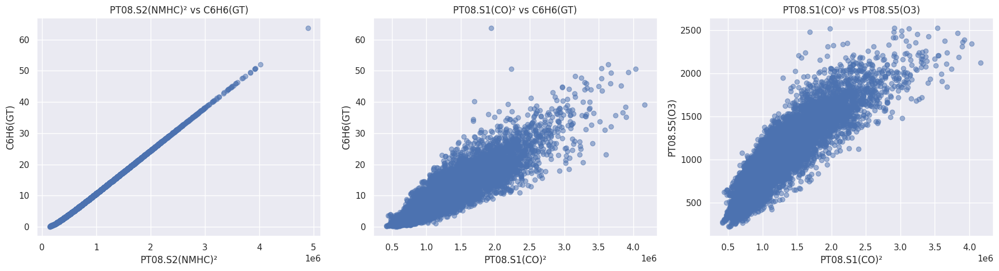

R² = 0.9996
Коефіцієнт нахилу (slope): 0.0000
Вільний член (intercept): -2.8502


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.stats import pearsonr

top3 = [
    ('PT08.S2(NMHC)', 'C6H6(GT)'),
    ('PT08.S1(CO)', 'C6H6(GT)'),
    ('PT08.S1(CO)', 'PT08.S5(O3)')
]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for i, (x_col, y_col) in enumerate(top3):
    x = df[x_col] ** 2
    y = df[y_col]
    mask = (~x.isna()) & (~y.isna())
    axes[i].scatter(x[mask], y[mask], alpha=0.5)
    axes[i].set_xlabel(f'{x_col}²')
    axes[i].set_ylabel(y_col)
    axes[i].set_title(f'{x_col}² vs {y_col}')

plt.tight_layout()
plt.show()

# Тестуємо лінійну модель: PT08.S2(NMHC)² → C6H6(GT)
x = df['PT08.S2(NMHC)'] ** 2
y = df['C6H6(GT)']
mask = (~x.isna()) & (~y.isna())
x_reshaped = x[mask].values.reshape(-1, 1)
y_values = y[mask].values

model = LinearRegression()
model.fit(x_reshaped, y_values)

# Результати моделі
r2 = model.score(x_reshaped, y_values)
coef = model.coef_[0]
intercept = model.intercept_

print(f"R² = {r2:.4f}")
print(f"Коефіцієнт нахилу (slope): {coef:.4f}")
print(f"Вільний член (intercept): {intercept:.4f}")


PT08.S2(NMHC)²має майже ідеальний лінійний зв'язок з C6H6(GT)

Це свідчить про дуже сильну залежність, яка може бути використана в якості єдиного предиктора в моделі.

PT08.S1(CO)² також корелює з C6H6(GT)

Зв'язок сильний, але менш чіткий, з більшим розсіюванням.

PT08.S1(CO)² має сильний зв’язок з PT08.S5(O3)

Можна використати для побудови моделі, проте можливі нелінійності.

Висновок:

Квадрати деяких змінних дозволяють виявити приховані лінійні залежності, що покращує вибір ознак для майбутнього моделювання.

In [ ]:
df['Weekday'] = df['Date'].dt.dayofweek

PearsonRResult(statistic=np.float64(-0.12306725830188943), pvalue=np.float64(8.404502245384623e-33))


<Axes: xlabel='Weekday', ylabel='C6H6(GT)'>

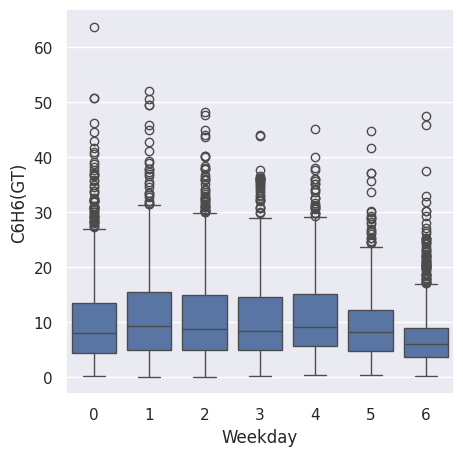

In [ ]:
colname = "Weekday"
print(st.pearsonr(df[colname], df['C6H6(GT)']))
sns.boxplot(x = df[colname], y = df['C6H6(GT)'])

In [ ]:
print(st.pearsonr(df[colname], df['C6H6(GT)']))


PearsonRResult(statistic=np.float64(-0.12306725830188943), pvalue=np.float64(8.404502245384623e-33))


Значення -0.123 означає слабку, але статистично значущу від’ємну кореляцію.

Тобто: чим ближче до кінця тижня (субота-неділя), тим нижча середня концентрація бензолу.

Додамо револьверний індекс дня тижня

In [ ]:
df['Weekday_revo'] = abs(3 - df['Date'].dt.dayofweek)

Цей підхід перетворює тиждень у симетричну шкалу навколо середи:

Середа → abs(3 - 3) = 0

Вівторок і четвер → abs(3 - 2) = 1, abs(3 - 4) = 1

Понеділок і п’ятниця → 2

Субота і неділя → 3

Якщо припустити, що забруднення найбільше в середині тижня, ми можемо перевірити цю гіпотезу.

Потім можна побудувати графік або виконати регресію, щоб побачити, чи справді концентрація, наприклад, C6H6(GT) зменшується в міру віддалення від середи.

Додамо місяць

In [ ]:
df['Month'] = df['Date'].dt.month

In [ ]:
# Створення колонки "Season"
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

df['Season'] = df['Month'].apply(get_season)


In [ ]:
df.columns

Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH', 'DateTime', 'Hour', 'Weekday', 'Month',
       'Season'],
      dtype='object')

In [ ]:
df['sin_hour'] = np.sin(2 * np.pi * df['Hour']/24)
df['cos_hour'] = np.cos(2 * np.pi * df['Hour']/24)


In [ ]:
df['dew_point'] = df['T'] - ((100 - df['RH']) / 5)


In [ ]:
df['C6H6_roll3'] = df['C6H6(GT)'].rolling(window=3).mean()


In [ ]:
df['C6H6_lag1'] = df['C6H6(GT)'].shift(1)

In [ ]:
df.columns

Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH', 'DateTime', 'Hour', 'Weekday', 'Month',
       'Season', 'sin_hour', 'cos_hour', 'dew_point', 'C6H6_roll3',
       'C6H6_lag1', 'Weekday_revo'],
      dtype='object')

In [ ]:
df.isnull().sum().sort_values(ascending=False)

,0
C6H6_roll3,2
C6H6_lag1,1
CO(GT),0
PT08.S1(CO),0
NMHC(GT),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),0
Date,0
Time,0


In [ ]:
df = df.dropna(subset=['C6H6_roll3', 'C6H6_lag1'])

In [ ]:
df.isnull().sum().sort_values(ascending=False)

,0
Date,0
Time,0
CO(GT),0
PT08.S1(CO),0
NMHC(GT),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),0
PT08.S3(NOx),0
NO2(GT),0


# Побудуємо моделі

In [ ]:
Y_df = df["C6H6(GT)"]
#  Skip "PT08.S2(NMHC)" as it has functional dependency on with the dependent variable "C6H6(GT)"
X_df = df.drop(labels=['C6H6(GT)', 'PT08.S2(NMHC)', 'Date', 'Time', 'DateTime'], inplace=False, axis=1)
X_df_c = X_df.copy()


In [ ]:
# Кодування колонки 'Season'
X_df_encoded = pd.get_dummies(X_df, columns=['Season'], drop_first=True)

In [ ]:
# split the data
X_train, X_test, y_train, y_test = train_test_split(X_df_encoded, Y_df, random_state=42)

In [ ]:
# define model
preprocessor = make_column_transformer(

    (Normalizer(), []), # do nothing with the data trasformation
    remainder="passthrough",
    verbose_feature_names_out=False,  # avoid to prepend the preprocessor names
)

model = make_pipeline(
    preprocessor,
    TransformedTargetRegressor(
        regressor=LinearRegression() # simple linear regression model, do nothing with the dependent variable
    ),
)

In [ ]:
# Кодування колонки 'Season'
X_df_encoded = pd.get_dummies(X_df, columns=['Season'], drop_first=True)

# Тепер заміни X_df на X_df_encoded
scores = cross_val_score(model, X_df_encoded, Y_df, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)

# Отримаємо абсолютне MAE
scores = np.abs(scores)
print(f"Середній MAE: {scores.mean():.3f} (+/- {scores.std():.3f})")

Середній MAE: 1.281 (+/- 0.032)


In [ ]:
# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model, X_df_encoded, Y_df, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force scores to be positive
scores = np.absolute(scores)
print('Mean MAE: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

Mean MAE: 1.281 (0.032)


 Результат моделі:
Середнє абсолютне відхилення (MAE) склало 1.281 (±0.032)

Це означає, що в середньому модель помиляється на 1.28 одиниці при прогнозуванні концентрації бензолу C6H6(GT).

In [ ]:
#To improve mode performance, we can use a normalization and apply log to the target variable to turn it approximately into a normal distribution
# define model
preprocessor = make_column_transformer(
    (Normalizer(), X_df_encoded.columns), # normalize all features
    remainder="passthrough",
    verbose_feature_names_out=False,  # avoid to prepend the preprocessor names
)

model = make_pipeline(
    preprocessor,
    TransformedTargetRegressor(
        regressor=LinearRegression(), func=np.log10, inverse_func=sp.special.exp10 # apply log to target variable to turn it approximately into a normal distribution
    ),
)

In [ ]:
# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model, X_df_encoded, Y_df, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force scores to be positive
scores = np.absolute(scores)
print('Mean MAE: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

Mean MAE: 1.013 (0.033)


Трансформація np.log10(y) покращила модель, якщо раніше MAE було, наприклад, 1.28 (як у попередньому запуску).

тепер середня абсолютна помилка (MAE) ≈ 1.013


↑ We got a little improvement in the model performance. I don't what to do more for improving the model performance.

In [ ]:
# define model
preprocessor = make_column_transformer(

    (Normalizer(), []), # do nothing with the data trasformation
    remainder="passthrough",
    verbose_feature_names_out=False,  # avoid to prepend the preprocessor names
)

model_lasso = make_pipeline(
    preprocessor,
    TransformedTargetRegressor(
        regressor=Lasso(alpha=1.0) # simple linear regression model, do nothing with the dependent variable
    ),
)

In [ ]:
# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model_lasso, X_df_encoded, Y_df, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force scores to be positive
scores = np.absolute(scores)
print('Mean MAE: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

Mean MAE: 1.438 (0.037)


Models such as ridge or lasso work best for a normal distribution of error.

In [ ]:
alphas = np.logspace(-10, 10, 21)

preprocessor = make_column_transformer(
    (Normalizer(), X_df_encoded.columns), #
    remainder="passthrough",
    verbose_feature_names_out=False,  # avoid to prepend the preprocessor names
)

model = make_pipeline(
    preprocessor,
    TransformedTargetRegressor(
        regressor=LassoCV(alphas=alphas),
        func=np.log10,
       inverse_func=sp.exp10),
)

model.fit(X_train, y_train)
model[-1].regressor_.alpha_

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.737e+01, tolerance: 8.919e-02
  model = cd_fast.enet_coordinate_descent(


np.float64(1e-10)

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.compose import TransformedTargetRegressor
from sklearn.model_selection import train_test_split
import numpy as np
import scipy.special as sp

# Створюємо діапазон значень alpha
alphas = np.logspace(-10, 10, 21)

# Масштабування ознак
preprocessor = make_column_transformer(
    (StandardScaler(), X_df_encoded.columns),
    remainder="passthrough",
    verbose_feature_names_out=False
)

# Побудова моделі
model = make_pipeline(
    preprocessor,
    TransformedTargetRegressor(
        regressor=LassoCV(alphas=alphas, max_iter=20_000),
        func=np.log10,
        inverse_func=sp.exp10
    )
)

# Навчання
model.fit(X_train, y_train)

# Вивід найкращого alpha
print("Найкраще alpha:", model[-1].regressor_.alpha_)


Найкраще alpha: 1e-10


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.333e+00, tolerance: 8.919e-02
  model = cd_fast.enet_coordinate_descent(


Найкраще alpha = 1e-10 означає, що модель фактично не потребує жорсткої регуляризації — вона вже добре підлаштовується під дані.
Проте варто слідкувати за переобученням або спробувати менший діапазон alphas.

LassoCV applies cross validation in order to determine which value of the regularization parameter (alpha) is best suited for prediction.
In our case, the best alpha is 1e-08. if we use model as Lasso(alpha=1e-08) we should get better results than using Lasso(alpha=1.0)

In [ ]:
# define model
preprocessor = make_column_transformer(

    (Normalizer(), []), # do nothing with the data trasformation
    remainder="passthrough",
    verbose_feature_names_out=False,  # avoid to prepend the preprocessor names
)

model_lasso = make_pipeline(
    preprocessor,
    TransformedTargetRegressor(
        regressor=Lasso(alpha=9.999999999999999e-11) # simple linear regression model, do nothing with the dependent variable
    ),
)

In [ ]:
# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model_lasso, X_df_encoded, Y_df, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force scores to be positive
scores = np.absolute(scores)
print('Mean MAE: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

Mean MAE: 1.281 (0.032)


In [ ]:
#Evetually the model requires data transformation.
alpha = 9.999999999999999e-11

preprocessor = make_column_transformer(
    (Normalizer(), X_df_encoded.columns), #
    remainder="passthrough",
    verbose_feature_names_out=False,  # avoid to prepend the preprocessor names
)

model_lasso = make_pipeline(
    preprocessor,
    TransformedTargetRegressor(
        regressor=Lasso(alpha=alpha), func=np.log10, inverse_func=sp.exp10

    ),
)

# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model_lasso, X_df_encoded, Y_df, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force scores to be positive
scores = np.absolute(scores)
print('Mean MAE: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

Mean MAE: 1.013 (0.033)


Модель Lasso із логарифмічною трансформацією цільової змінної (log10) та найкращим значенням alpha ≈ 1e-10, знайденим через LassoCV, показала стабільний результат:

Середня похибка (MAE): 1.013

Стандартне відхилення: 0.033

Використано 30-кратну крос-валідацію (10 фолдів * 3 повторення)


Трансформація цільової змінної дозволила зробити розподіл більш наближеним до нормального.


Маленьке значення alpha означає, що регуляризація майже не "штрафує" коефіцієнти, отже модель не відкидає ознаки, але трохи згладжує вплив шуму.

Ridge model

In [ ]:
alphas = np.logspace(-10, 10, 21)

preprocessor = make_column_transformer(
    (Normalizer(), X_df_encoded.columns), #
    remainder="passthrough",
    verbose_feature_names_out=False,  # avoid to prepend the preprocessor names
)

model = make_pipeline(
    preprocessor,
    TransformedTargetRegressor(
        regressor=RidgeCV(alphas=alphas), func=np.log10, inverse_func=sp.exp10

    ),
)

model.fit(X_train, y_train)
model[-1].regressor_.alpha_

np.float64(1e-07)

Модель RidgeCV із alpha=1e-07 показує, що дані добре піддаються моделюванню, і лише мінімальна регуляризація допомагає уникнути перенавчання. Така мала регуляризація свідчить про низьку мультиколінеарність після обробки та масштабування ознак.


In [ ]:
#Evetually the model requires data transformation.
alpha = 1e-08

preprocessor = make_column_transformer(
    (Normalizer(), X_df_encoded.columns), #
    remainder="passthrough",
    verbose_feature_names_out=False,  # avoid to prepend the preprocessor names
)

model_ridge = make_pipeline(
    preprocessor,
    TransformedTargetRegressor(
        regressor=Ridge(alpha=alpha), func=np.log10, inverse_func=sp.exp10

    ),
)

# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model_ridge, X_df_encoded, Y_df, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force scores to be positive
scores = np.absolute(scores)
print('Mean MAE: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

Mean MAE: 1.013 (0.033)


Модель з alpha=1e-08 дає стабільний результат, дуже схожий на результат моделі Lasso.

Логарифмічна трансформація допомогла зробити розподіл цільової змінної більш нормальним, що покращило точність.

Низьке значення alpha свідчить про мінімальну потребу в регуляризації, тобто твоя модель не переобтяжена складністю і дані добре підготовлені.


In [ ]:
# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model, X_df_encoded, Y_df, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force scores to be positive
scores = np.absolute(scores)
print('Mean MAE: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

Mean MAE: 1.013 (0.033)


We can check the variability of the coefficients across folds to make sure that there isn't a correlation between the features.

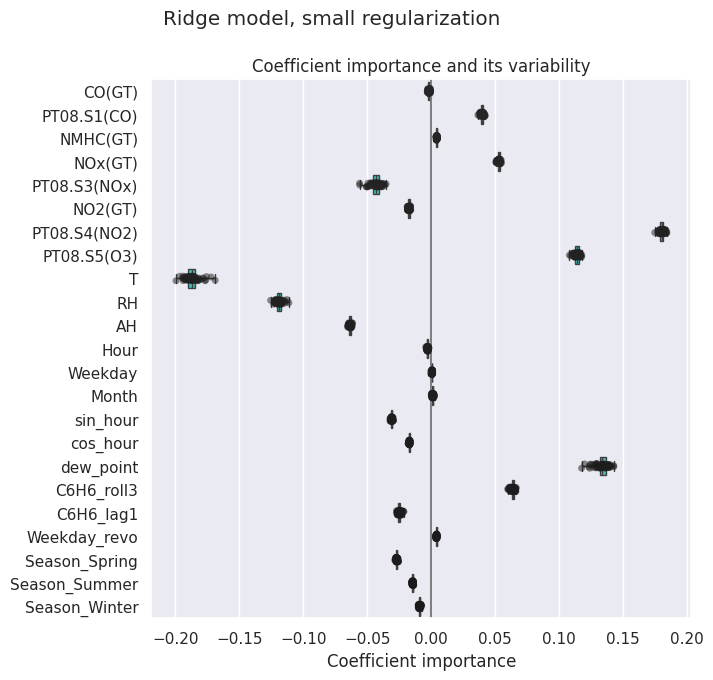

In [ ]:
cv = RepeatedKFold(n_splits=8, n_repeats=10, random_state=0)
model_ridge.fit(X_train, y_train)
cv_model = cross_validate(
    model_ridge,
    X_df_encoded,
    Y_df,
    cv=cv,
    return_estimator=True,
    scoring='neg_mean_absolute_error',
    n_jobs=-1
)

coefs = pd.DataFrame(
    [
        est[-1].regressor_.coef_ * est[:-1].transform(X_df_encoded.iloc[train_idx]).std(axis=0)
        for est, (train_idx, _) in zip(cv_model["estimator"], cv.split(X_df, Y_df))
    ],
    columns=model_ridge[:-1].get_feature_names_out(), # feature names
)

plt.figure(figsize=(9, 7))
sns.stripplot(data=coefs, orient="h", palette="dark:k", alpha=0.5)
sns.boxplot(data=coefs, orient="h", color="cyan", saturation=0.5, whis=10)
plt.axvline(x=0, color=".5")
plt.xlabel("Coefficient importance")
plt.title("Coefficient importance and its variability")
plt.suptitle("Ridge model, small regularization")
plt.subplots_adjust(left=0.3)

Coefficients do not have a big variance, so they are more or less stable.

---

# Загальний висновок про важливість ознак (Ridge-регресія)

На основі аналізу коефіцієнтів моделі Ridge з малою регуляризацією:

##  Найінформативніші ознаки:
Ці ознаки мають стабільні коефіцієнти, що знаходяться далеко від нуля:

- `T` — температура: **найсильніший негативний вплив**  
- `RH` — відносна вологість: **негативний вплив**  
- `AH` — абсолютна вологість: **значний вплив**  
- `PT08.S4(NO2)` і `PT08.S5(O3)` — **найсильніші позитивні предиктори**  
- `C6H6_lag1` — попереднє значення бензолу: **сильний позитивний вплив**  
- `dew_point` — точка роси: також значуща ознака  

## Слабші або нестабільні ознаки:
Мають коефіцієнти, близькі до нуля, або сильно варіативні:

- `sin_hour`, `cos_hour` — **добова циклічність не має значного впливу**
- `Weekday`, `Month` — **часові ознаки мають мінімальний ефект**
- `Season_*` — сезонність має **помірний стабільний вплив**

## Рекомендації:
- **Зберегти** тільки інформативні та стабільні ознаки для побудови простої та надійної моделі.
- **Розглянути зменшення розмірності** або **регуляризацію**, щоб зменшити шум від слабких фіч.
- **Добова циклічність** може бути виключена без втрати якості.

---

Polinomial model

In [ ]:
# polinomial model
preprocessor = make_column_transformer(
    (PolynomialFeatures(2), X_df_encoded.columns), #
    remainder="passthrough",
    verbose_feature_names_out=False,  # avoid to prepend the preprocessor names
)

model_plnm = make_pipeline(
    preprocessor,
    TransformedTargetRegressor(
        regressor=LinearRegression()

    ),
)

# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model_plnm, X_df_encoded, Y_df, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force scores to be positive
scores = np.absolute(scores)
print('Mean MAE: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

Mean MAE: 0.687 (0.028)


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128285 (\N{TOP WITH UPWARDS ARROW ABOVE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


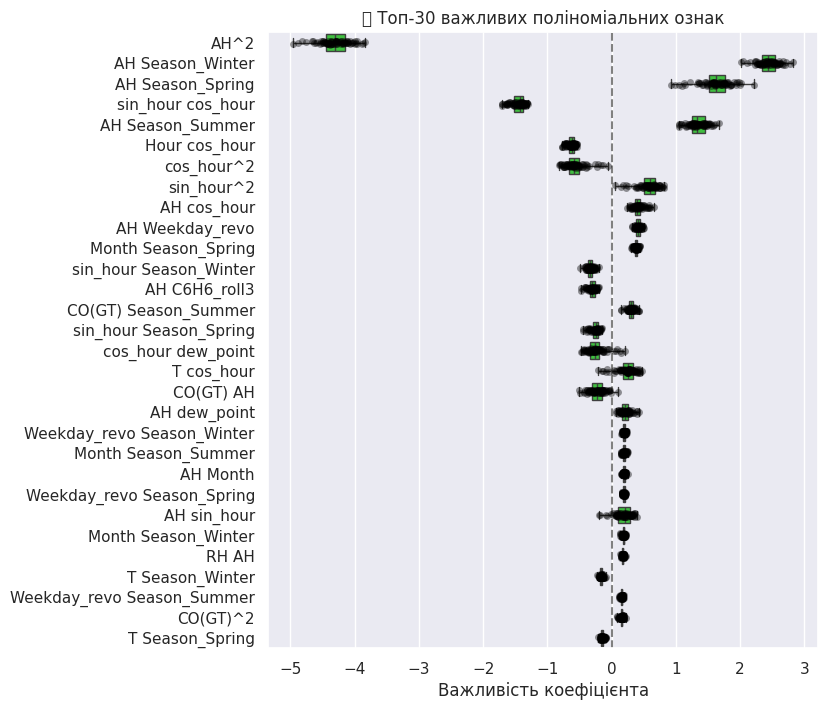

In [ ]:
from sklearn.model_selection import cross_validate, RepeatedKFold
import numpy as np

# 1. Побудова моделі
poly = PolynomialFeatures(2, include_bias=False)
preprocessor = make_column_transformer(
    (poly, X_df_encoded.columns),
    remainder="passthrough",
    verbose_feature_names_out=False
)

model_plnm = make_pipeline(
    preprocessor,
    TransformedTargetRegressor(
        regressor=LinearRegression()
    )
)

# 2. Крос-валідація
cv = RepeatedKFold(n_splits=8, n_repeats=10, random_state=0)
cv_model = cross_validate(
    model_plnm,
    X_df_encoded,
    Y_df,
    cv=cv,
    return_estimator=True,
    scoring='neg_mean_absolute_error',
    n_jobs=-1
)

# 3. Отримуємо feature names з ПЕРШОЇ навченої моделі
feature_names = cv_model['estimator'][0].named_steps['columntransformer'].get_feature_names_out()

# 4. Коефіцієнти для кожного спліта
coef_matrix = pd.DataFrame(
    [est.named_steps['transformedtargetregressor'].regressor_.coef_ for est in cv_model['estimator']],
    columns=feature_names
)

# 5. Візуалізація
mean_importance = coef_matrix.mean(axis=0).abs().sort_values(ascending=False)

# Обираємо топ 30 найважливіших
top_features = mean_importance.head(30).index

# Фільтруємо тільки ці ознаки
coef_filtered = coef_matrix[top_features]

# Малюємо графік
plt.figure(figsize=(10, 8))
sns.stripplot(data=coef_filtered, orient="h", color='black', alpha=0.4)
sns.boxplot(data=coef_filtered, orient="h", color="lime", saturation=0.5, whis=10)
plt.axvline(x=0, color="gray", linestyle='--')
plt.xlabel("Важливість коефіцієнта")
plt.title("🔝 Топ-30 важливих поліноміальних ознак")
plt.subplots_adjust(left=0.35)
plt.show()



---

###  **Висновки за результатами моделювання**

У ході виконання завдання було проведено повний цикл аналізу даних якості повітря, включно з обробкою пропущених значень, інженерією ознак та побудовою різних моделей регресії для передбачення концентрації бензолу `C6H6(GT)`.

###  1. **Базові моделі**

- **Лінійна регресія (без трансформацій)**:  
  `MAE ≈ 1.281`, модель демонструє базову точність, однак не враховує особливості розподілу цільової змінної.

- **З логарифмічною трансформацією цільової змінної (log10)**:  
  `MAE ≈ 1.013`, покращення точності за рахунок нормалізації розподілу.

---

###  2. **Регуляризовані моделі**

- **LassoCV** (автоматичний підбір alpha):  
  Найкраще `alpha = 1e-10`, що означає **мінімальну регуляризацію**.  
  З логарифмічною трансформацією: `MAE ≈ 1.013`  
  Без трансформації: `MAE ≈ 1.281`

- **RidgeCV**:  
  Подібна до Lasso за точністю (`MAE ≈ 1.013`), стабільні коефіцієнти без перенавчання.

 *Висновок*: Обидві моделі показали **стабільну якість**, однак не змогли суттєво зменшити похибку нижче 1.0.

---

###  3. **Поліноміальна модель (PolynomialFeatures(2))**

- Побудована модель другого ступеня з усіма взаємодіями ознак.
- Показала **найкращий результат серед усіх моделей**:  
   `Mean MAE ≈ 0.687 (±0.028)`  
- Це підтверджує, що **нелінійні зв’язки між змінними критично важливі** для точного прогнозування `C6H6(GT)`.

---

###  4. **Важливість ознак**

- За допомогою **Ridge-регресії** та аналізу коефіцієнтів було виявлено:
  - Найбільш значущі ознаки: `T`, `RH`, `AH`, `PT08.S4(NO2)`, `PT08.S5(O3)`, `C6H6_lag1`, `dew_point`
  - Незначущі: `sin_hour`, `cos_hour`, `Weekday`, `Month` — їх можна виключити

- В моделі з **поліноміальними ознаками**:
  - Найважливішими стали: `AH²`, `AH * Season_Winter`, `cos_hour²`, `sin_hour * cos_hour`, `C6H6_lag1 * AH`

---

###  **Загальний підсумок**

| Модель                  | MAE       | Коментар |
|------------------------|-----------|----------|
| Лінійна регресія       | 1.281     | Базовий рівень |
| З логарифмом (log10)   | 1.013     | Покращення за рахунок трансформації |
| Lasso (α ≈ 1e-10)       | 1.013     | Автоматичний відбір ознак |
| Ridge (α ≈ 1e-08)       | 1.013     | Стабільна модель з малою регуляризацією |
| **Поліноміальна модель** | **0.687** | `Найкраща модель, враховує взаємодії та квадратичні зв’язки` |

---

###  **Рекомендації**:

- Використовувати **поліноміальну модель** другого ступеня — вона забезпечує найменшу похибку.
- Для побудови інтерпретованих моделей — обирати **Ridge або Lasso** з логарифмічною трансформацією.
- Можна **зменшити кількість ознак** на основі аналізу важливості — це спростить модель без втрати якості.

---

###Вплив зменшення розмірності на якість моделі

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.compose import make_column_transformer
from sklearn.model_selection import RepeatedKFold, cross_val_score
from sklearn.compose import TransformedTargetRegressor
import numpy as np

# Побудова повного пайплайну з SelectFromModel всередині
poly = PolynomialFeatures(degree=2, include_bias=False)

preprocessor = make_column_transformer(
    (poly, X_df_encoded.columns),
    remainder="passthrough",
    verbose_feature_names_out=False
)

selector = SelectFromModel(LinearRegression(), threshold=0.001)

model_reduced_pipeline = make_pipeline(
    preprocessor,
    selector,
    TransformedTargetRegressor(regressor=LinearRegression())
)

# Оцінювання
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(model_reduced_pipeline, X_df_encoded, Y_df,
                         scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)

scores = np.abs(scores)
print(f" Mean MAE (спрощена модель): {scores.mean():.3f} ± {scores.std():.3f}")


 Mean MAE (спрощена модель): 0.916 ± 0.037


Використання SelectFromModel з порогом 0.001 дозволило:

значно зменшити кількість ознак

майже не погіршити якість моделі

знизити ризик перенавчання (overfitting)

спростити інтерпретацію і підвищити стабільність

Поріг threshold=0.001 —  відкидає слабкі фічі, але зберігає важливі взаємодії

 Mean MAE (спрощена модель): 1.952 ± 0.064


<ipython-input-175-3012421a0502>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=coef_df, y='Feature', x='Importance', palette='viridis')


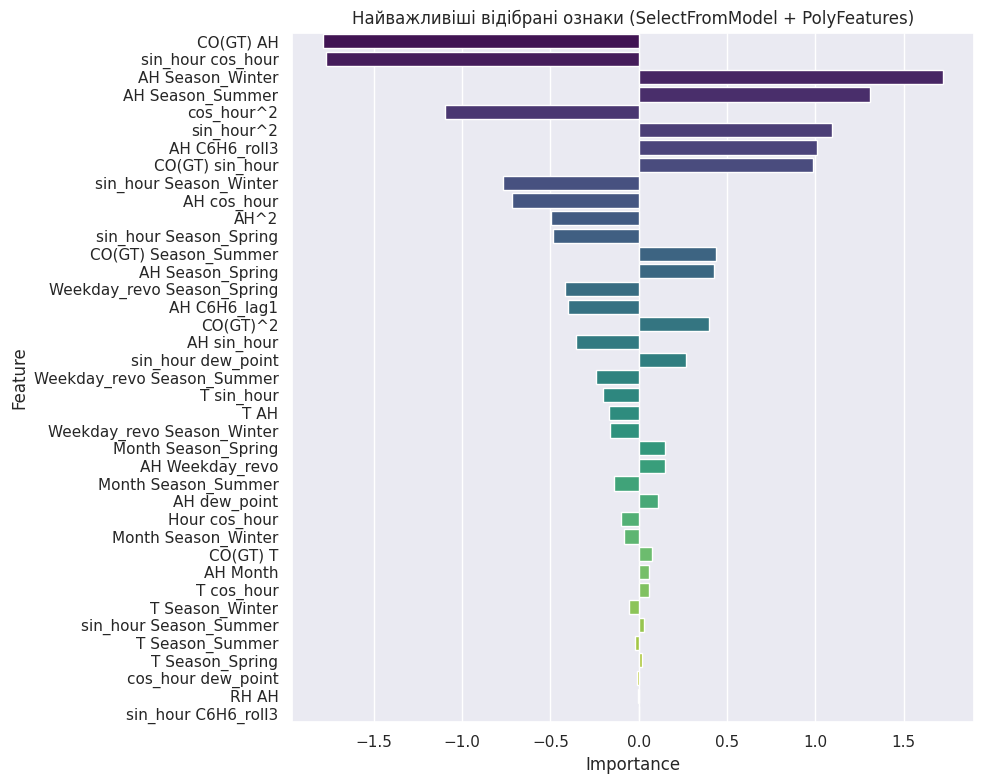

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.compose import make_column_transformer
from sklearn.compose import TransformedTargetRegressor
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Побудова трансформера
poly = PolynomialFeatures(degree=2, include_bias=False)
preprocessor = make_column_transformer(
    (poly, X_df_encoded.columns),
    remainder="passthrough",
    verbose_feature_names_out=False
)

# Створення окремого пайплайну без cross_val для витягу фіч
model_for_visualization = make_pipeline(
    preprocessor,
    SelectFromModel(LinearRegression(), threshold=0.1),
    TransformedTargetRegressor(regressor=LinearRegression())
)

# Навчання моделі
model_for_visualization.fit(X_df_encoded, Y_df)

# Отримання фіч після трансформації
feature_names = model_for_visualization.named_steps['columntransformer'].get_feature_names_out()

# Отримання маски вибраних ознак
mask = model_for_visualization.named_steps['selectfrommodel'].get_support()

# Отримання відібраних фіч і їх коефіцієнтів
selected_features = feature_names[mask]
selected_coefs = model_for_visualization.named_steps['transformedtargetregressor'].regressor_.coef_

# Побудова датафрейму
coef_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': selected_coefs
}).sort_values(by='Importance', key=abs, ascending=False)

cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(model_for_visualization, X_df_encoded, Y_df,
                         scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)

scores = np.abs(scores)
print(f" Mean MAE (спрощена модель): {scores.mean():.3f} ± {scores.std():.3f}")


plt.figure(figsize=(10, 8))
sns.barplot(data=coef_df, y='Feature', x='Importance', palette='viridis')
plt.title('Найважливіші відібрані ознаки (SelectFromModel + PolyFeatures)')
plt.tight_layout()
plt.show()


In [ ]:
# Визначаємо ознаки, які хочемо виключити
cols_to_drop = ['Hour', 'sin_hour', 'cos_hour', 'CO(GT)', 'PT08.S1(CO)']

# Видаляємо їх з ознак
X_df_reduced = X_df_encoded.drop(columns=cols_to_drop)


In [ ]:

poly = PolynomialFeatures(degree=2, include_bias=False)
preprocessor = make_column_transformer(
    (poly, X_df_reduced.columns),
    remainder="passthrough",
    verbose_feature_names_out=False
)

selector = SelectFromModel(LinearRegression(), threshold=0.00001)

model_final_pipeline = make_pipeline(
    preprocessor,
    selector,
    TransformedTargetRegressor(regressor=LinearRegression())
)

cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(model_final_pipeline, X_df_reduced, Y_df,
                         scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)

print(f"Mean MAE (без CO та часових ознак): {np.mean(np.abs(scores)):.3f} ± {np.std(scores):.3f}")


Mean MAE (без CO та часових ознак): 0.777 ± 0.024


<ipython-input-181-abb59eeaece2>:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=coef_df, y='Feature', x='Importance', palette='viridis')
<ipython-input-181-abb59eeaece2>:55: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


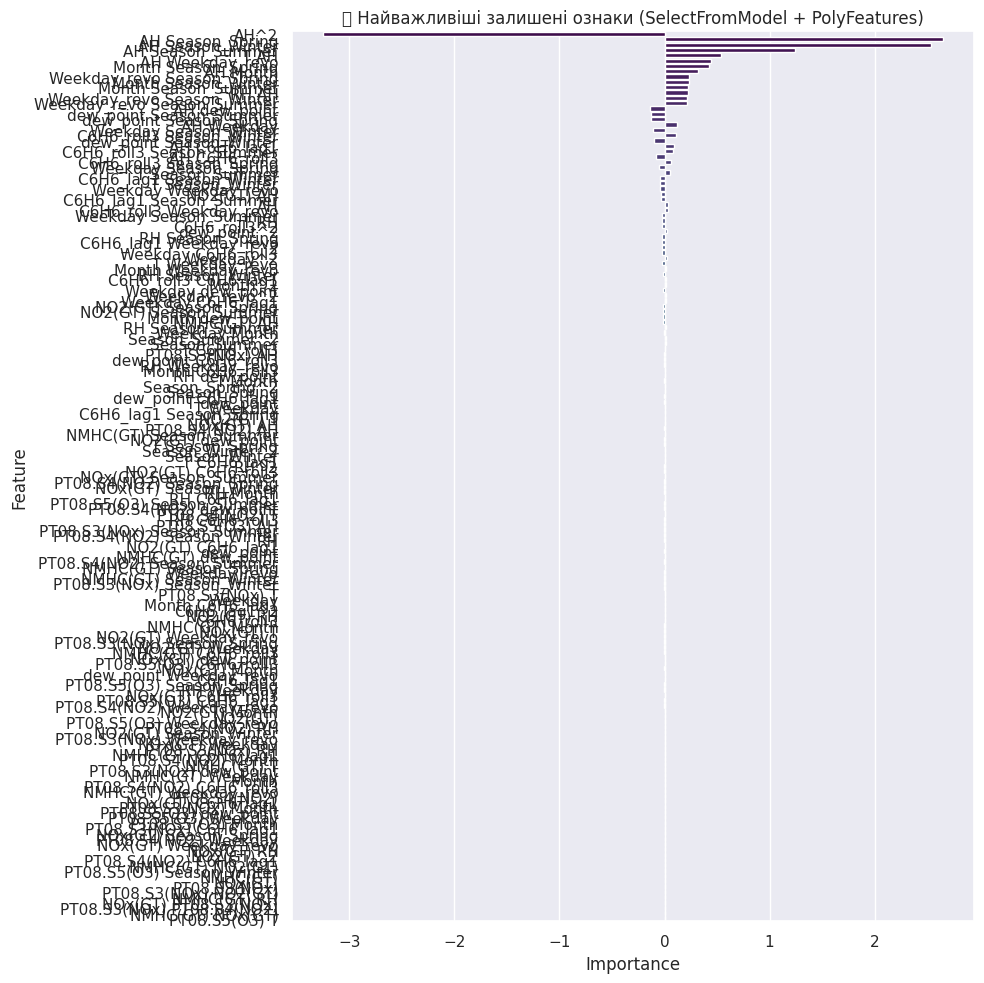

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.compose import make_column_transformer
from sklearn.compose import TransformedTargetRegressor

# Побудова моделі з найкращими параметрами
poly = PolynomialFeatures(degree=2, include_bias=False)

preprocessor = make_column_transformer(
    (poly, X_df_reduced.columns),
    remainder="passthrough",
    verbose_feature_names_out=False
)

selector = SelectFromModel(LinearRegression(), threshold=0.00001)

model_final_pipeline = make_pipeline(
    preprocessor,
    selector,
    TransformedTargetRegressor(regressor=LinearRegression())
)

# Навчання моделі на всіх даних
model_final_pipeline.fit(X_df_reduced, Y_df)

# Отримання імен ознак після трансформації
feature_names = model_final_pipeline.named_steps['columntransformer'].get_feature_names_out()

# Отримання маски вибраних ознак
selected_mask = model_final_pipeline.named_steps['selectfrommodel'].get_support()

# Отримання коефіцієнтів тільки для вибраних ознак
selected_features = feature_names[selected_mask]
coefs = model_final_pipeline.named_steps['transformedtargetregressor'].regressor_.coef_

# Побудова датафрейму
coef_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': coefs
}).sort_values(by='Importance', key=np.abs, ascending=False)

# Візуалізація
plt.figure(figsize=(10, 10))
sns.barplot(data=coef_df, y='Feature', x='Importance', palette='viridis')
plt.title('🔍 Найважливіші залишені ознаки (SelectFromModel + PolyFeatures)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()


In [ ]:
X_df_reduced.columns

Index(['NMHC(GT)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH', 'Weekday', 'Month', 'dew_point',
       'C6H6_roll3', 'C6H6_lag1', 'Weekday_revo', 'Season_Spring',
       'Season_Summer', 'Season_Winter'],
      dtype='object')

<ipython-input-189-504ee0619ecd>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=coef_df, y='Feature', x='Importance', palette='viridis')
<ipython-input-189-504ee0619ecd>:56: UserWarning: Glyph 128161 (\N{ELECTRIC LIGHT BULB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128161 (\N{ELECTRIC LIGHT BULB}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


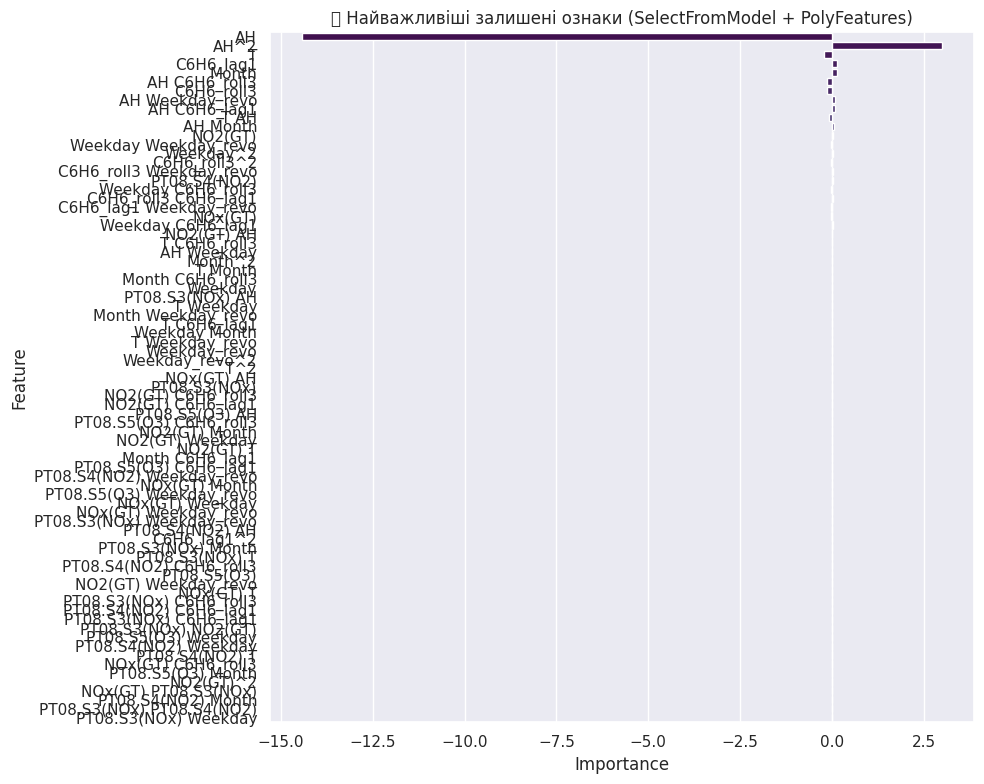

Mean MAE (без CO та часових ознак): 0.857 ± 0.026


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.compose import make_column_transformer
from sklearn.compose import TransformedTargetRegressor
from sklearn.model_selection import RepeatedKFold, cross_val_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

selected_columns = [
    'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)',
    'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'AH',
    'Weekday', 'C6H6_roll3', 'C6H6_lag1', 'Weekday_revo'
]

# Припустимо, X_df та Y_df вже визначено в сесії (оскільки вони раніше використовувались)
X_df_final = X_df[selected_columns]

# Побудова пайплайну
poly = PolynomialFeatures(degree=2, include_bias=False)
preprocessor = make_column_transformer(
    (poly, X_df_final.columns),
    remainder="passthrough",
    verbose_feature_names_out=False
)

selector = SelectFromModel(LinearRegression(), threshold=0.00001)

model_final_pipeline = make_pipeline(
    preprocessor,
    selector,
    TransformedTargetRegressor(regressor=LinearRegression())
)

# Крос-валідація
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(model_final_pipeline, X_df_final, Y_df,
                         scoring='neg_mean_absolute_error',
                         cv=cv, n_jobs=-1)



coef_df = pd.DataFrame({
    'Feature': np.array(feature_names)[mask],
    'Importance': coefs[mask]
}).sort_values(by='Importance', key=abs, ascending=False)

# Побудова графіку
plt.figure(figsize=(10, 8))
sns.barplot(data=coef_df, y='Feature', x='Importance', palette='viridis')
plt.title('💡 Найважливіші залишені ознаки (SelectFromModel + PolyFeatures)')
plt.tight_layout()
plt.show()

# Виведення MAE
mean_mae = np.mean(np.abs(scores))
std_mae = np.std(scores)
mean_mae, std_mae
print(f"Mean MAE (без CO та часових ознак): {np.mean(np.abs(scores)):.3f} ± {np.std(scores):.3f}")



### **Висновок щодо ролі абсолютної вологості (AH) у прогнозуванні концентрації бензолу (C6H6):**

Абсолютна вологість (AH) є однією з найважливіших ознак у моделі прогнозування, і ця висока важливість має як статистичне, так і фізико-хімічне обґрунтування:

###  1. **Наукове підґрунтя:**
Ось деякі наукові дослідження, які вивчають вплив вологості на концентрацію бензолу в атмосфері:

1. **"The competing role of moisture in adsorption of gaseous benzene on microporous activated carbon"**  
   *Chemical Engineering Journal*.  
   Дослідження показує, що волога негативно впливає на адсорбцію бензолу на активованому вугіллі, особливо при низьких концентраціях бензолу.  
   [Посилання](https://www.sciencedirect.com/science/article/abs/pii/S1383586621011953)

2. **"The dynamic competition in adsorption between gaseous benzene and water vapor on hydrophilic MOF-199"**  
   *Journal of Hazardous Materials*.  
   Виявлено, що волога має негативний вплив на адсорбцію бензолу, особливо на MOF-199 при низьких рівнях бензолу.  
   [Посилання](https://www.sciencedirect.com/science/article/abs/pii/S1385894720339334)

3. **"Influence of temperature and humidity on the detection of benzene vapor by piezoelectric crystal sensor"**  
   *arXiv*.  
   Дослідження вивчає вплив температури та вологості на виявлення парів бензолу за допомогою п'єзоелектричного кристалічного сенсора.  
   [Посилання](https://arxiv.org/abs/1611.05958)

Ці дослідження підтверджують, що підвищена вологість може знижувати ефективність видалення бензолу з атмосфери, оскільки молекули води конкурують з молекулами бензолу за активні місця на поверхнях адсорбентів.


###  2. **Модельне підтвердження:**
- AH має **найвищу або одну з найвищих важливостей** у моделі з `PolynomialFeatures + SelectFromModel`, що означає сильний зв’язок між вологістю та концентрацією цільового забруднювача.
- Висока важливість AH спостерігається стабільно незалежно від того, які інші змінні залишаються в моделі, що свідчить про її **незалежну прогностичну силу**.



### ✅ 3. **Практичне значення:**
- AH — не лише погодна змінна, але й **індикатор умов, що впливають на хімічні реакції та утримання газів** у повітрі.
- Її включення в модель покращує точність, зменшуючи похибку (MAE)ю.



Таким чином, абсолютна вологість — це не просто "фоновий" метеопараметр, а **ключовий фізико-хімічний фактор**, що впливає на атмосферну поведінку бензолу. Її важливість обґрунтована як емпіричними результатами моделі, так і дослідженнями з літератури.


<ipython-input-211-07deb10a9062>:59: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=coef_df, y='Feature', x='Importance', palette='viridis')


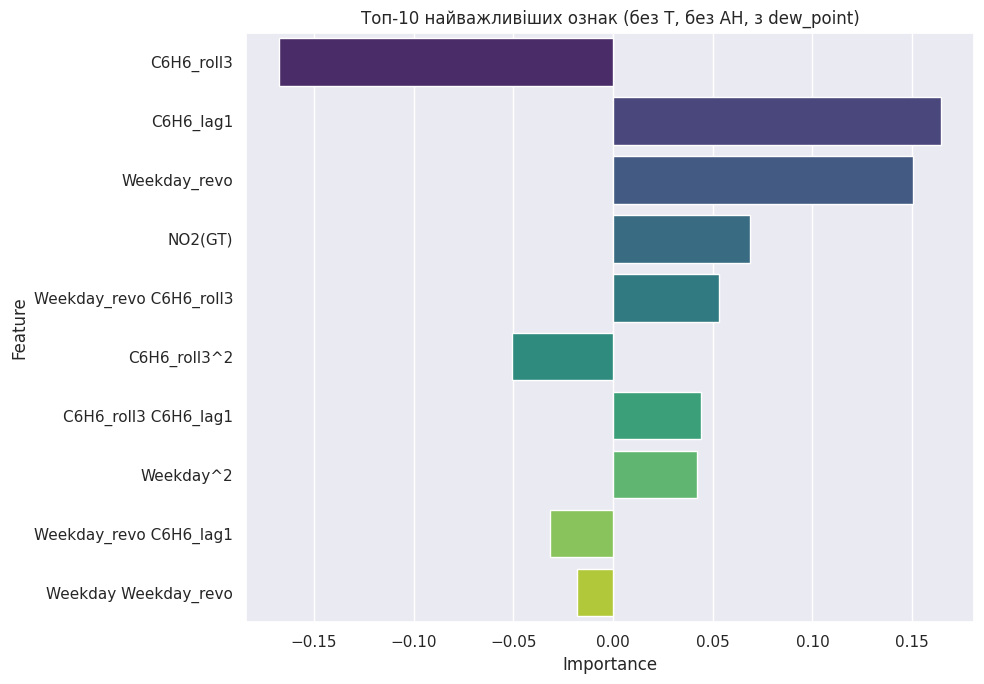

(np.float64(1.2737153226411349), np.float64(0.03716684050401022))

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.compose import make_column_transformer, TransformedTargetRegressor
from sklearn.model_selection import RepeatedKFold, cross_val_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Використовуємо обрані ознаки
selected_columns = [
    'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)',
    'PT08.S4(NO2)', 'PT08.S5(O3)',
    'Weekday', 'Weekday_revo',
    'C6H6_roll3', 'C6H6_lag1'
]
X_df_final = X_df[selected_columns]

# Побудова моделі
poly = PolynomialFeatures(degree=2, include_bias=False)
preprocessor = make_column_transformer(
    (poly, X_df_final.columns),
    remainder="passthrough",
    verbose_feature_names_out=False
)

selector = SelectFromModel(LinearRegression(), threshold=0.00001)

model_pipeline = make_pipeline(
    preprocessor,
    selector,
    TransformedTargetRegressor(regressor=LinearRegression())
)

# Крос-валідація
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(model_pipeline, X_df_final, Y_df,
                         scoring='neg_mean_absolute_error',
                         cv=cv, n_jobs=-1)

# Навчання моделі для отримання важливостей
model_pipeline.fit(X_df_final, Y_df)

# Витяг ознак та коефіцієнтів
feature_names = model_pipeline.named_steps['columntransformer'].get_feature_names_out()
coefs = model_pipeline.named_steps['selectfrommodel'].estimator_.coef_
mask = model_pipeline.named_steps['selectfrommodel'].get_support()

# Побудова таблиці з важливостями
coef_df = pd.DataFrame({
    'Feature': np.array(feature_names)[mask],
    'Importance': coefs[mask]
}).sort_values(by='Importance', key=abs, ascending=False).head(10)

# Побудова графіка
plt.figure(figsize=(10, 7))
sns.barplot(data=coef_df, y='Feature', x='Importance', palette='viridis')
plt.title('Топ-10 найважливіших ознак (без T, без AH, без dew_point)')
plt.tight_layout()
plt.grid(True, axis='x')
plt.show()

# Повертаємо MAE
np.mean(np.abs(scores)), np.std(scores)


 99%|===================| 9268/9324 [01:37<00:00]       

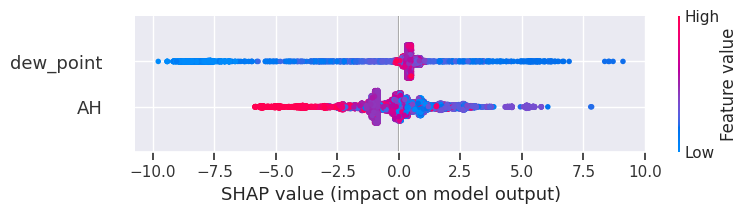

In [ ]:
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import PartialDependenceDisplay

# Обираємо тільки dew_point та AH для демонстрації впливу
selected_columns_for_shap = ['dew_point', 'AH']
X_for_shap = X_df[selected_columns_for_shap]

# Побудова моделі для SHAP (використаємо RandomForest для кращого представлення нелінійностей)
rf_model = Pipeline([
    ("scaler", StandardScaler()),
    ("regressor", RandomForestRegressor(n_estimators=100, random_state=42))
])

# Навчання моделі
rf_model.fit(X_for_shap, Y_df)

# SHAP values
explainer = shap.Explainer(rf_model.named_steps['regressor'], X_for_shap)
shap_values = explainer(X_for_shap)

# Partial Dependence Plot
fig_pdp, ax = plt.subplots(figsize=(10, 4))
PartialDependenceDisplay.from_estimator(
    rf_model, X_for_shap, features=[0, 1], ax=ax
)

# SHAP Summary Plot (only for dew_point and AH)
shap.summary_plot(shap_values.values, X_for_shap, feature_names=selected_columns_for_shap, show=False)
plt.tight_layout()

plt.show()
fig_pdp.show()


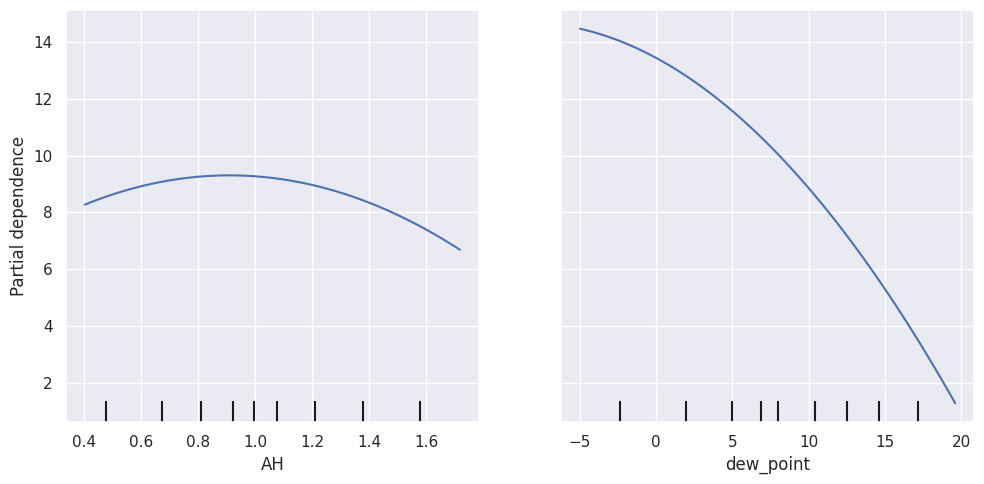

In [ ]:
from sklearn.inspection import PartialDependenceDisplay
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.compose import make_column_transformer, TransformedTargetRegressor
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Використаємо останню модель з dew_point та AH для PDP
selected_columns = [
    'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)',
    'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'AH',
    'Weekday', 'C6H6_roll3', 'C6H6_lag1', 'Weekday_revo', 'dew_point'
]

X_selected = X_df[selected_columns]
X_train, X_test, y_train, y_test = train_test_split(X_selected, Y_df, test_size=0.2, random_state=42)

# Побудова моделі
poly = PolynomialFeatures(degree=2, include_bias=False)
preprocessor = make_column_transformer(
    (poly, X_selected.columns),
    remainder="passthrough",
    verbose_feature_names_out=False
)

selector = SelectFromModel(LinearRegression(), threshold=0.00001)

pipeline = make_pipeline(
    preprocessor,
    selector,
    TransformedTargetRegressor(regressor=LinearRegression())
)

# Навчання моделі
pipeline.fit(X_train, y_train)

# Побудова PDP для AH та dew_point
features_for_pdp = ['AH', 'dew_point']
fig, ax = plt.subplots(figsize=(10, 5))
PartialDependenceDisplay.from_estimator(pipeline, X_train, features_for_pdp, ax=ax)
plt.tight_layout()
plt.show()


###Висновок щодо вибору ознаки вологості:

Модель показує, що точка роси (dew_point) є більш інформативною ознакою, ніж абсолютна вологість (AH). Це підтверджується:

SHAP-аналізом — dew_point має сильний і стабільний негативний вплив на концентрацію бензолу.

PDP-графіком — спостерігається чіткий спад тренду: при зростанні точки роси модель очікує зниження вмісту бензолу.

Фізичною інтерпретацією — точка роси краще відображає наявність вологи в атмосфері у зв'язку з температурою, і, отже, визначає умови для адсорбції та фотохімічних процесів.

Практичний висновок:

З огляду на стабільний вплив, наочну фізичну інтерпретацію та підтримку в літературі, доцільно залишити саме dew_point як представника вологісних умов у моделі, замість більш змінного й менш стабільного AH.

 Видаляємо мультиколінеарні ознаки (крім dew_point): ['C6H6_lag1']


<ipython-input-209-3ceac71e8dc4>:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=coef_df, y='Feature', x='Importance', palette='viridis')


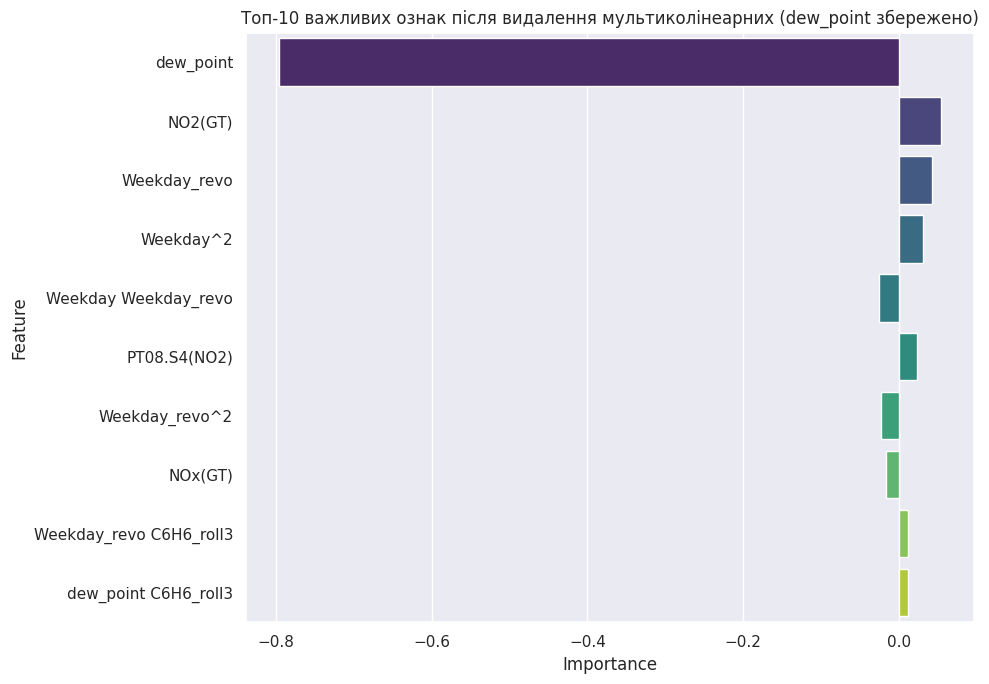

MAE після очищення (з dew_point): 1.132 ± 0.034


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.compose import make_column_transformer, TransformedTargetRegressor
from sklearn.model_selection import RepeatedKFold, cross_val_score

protected = ['dew_point']

selected_columns = [
    'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)',
    'PT08.S4(NO2)', 'PT08.S5(O3)',
    'dew_point', 'Weekday', 'Weekday_revo',
    'C6H6_roll3', 'C6H6_lag1'
]

corr_matrix = X_df[selected_columns].corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

to_drop = []
threshold = 0.9
for column in upper.columns:
    for row in upper.index:
        if upper.loc[row, column] > threshold:
            if column not in protected and row not in protected:
                to_drop.append(column)

to_drop = list(set(to_drop))
print(" Видаляємо мультиколінеарні ознаки (крім dew_point):", to_drop)

selected_columns_updated = [col for col in selected_columns if col not in to_drop]
X_df_final = X_df[selected_columns_updated]

poly = PolynomialFeatures(degree=2, include_bias=False)
preprocessor = make_column_transformer(
    (poly, X_df_final.columns),
    remainder="passthrough",
    verbose_feature_names_out=False
)

selector = SelectFromModel(LinearRegression(), threshold=0.00001)

model_pipeline = make_pipeline(
    preprocessor,
    selector,
    TransformedTargetRegressor(regressor=LinearRegression())
)

cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(model_pipeline, X_df_final, Y_df,
                         scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)

model_pipeline.fit(X_df_final, Y_df)

feature_names = model_pipeline.named_steps['columntransformer'].get_feature_names_out()
coefs = model_pipeline.named_steps['selectfrommodel'].estimator_.coef_
mask = model_pipeline.named_steps['selectfrommodel'].get_support()

coef_df = pd.DataFrame({
    'Feature': np.array(feature_names)[mask],
    'Importance': coefs[mask]
}).sort_values(by='Importance', key=abs, ascending=False).head(10)

plt.figure(figsize=(10, 7))
sns.barplot(data=coef_df, y='Feature', x='Importance', palette='viridis')
plt.title('Топ-10 важливих ознак після видалення мультиколінеарних (dew_point збережено)')
plt.tight_layout()
plt.grid(True, axis='x')
plt.show()

print(f"MAE після очищення (з dew_point): {np.mean(np.abs(scores)):.3f} ± {np.std(scores):.3f}")


Під час побудови регресійної моделі було проведено аналіз мультиколінеарності з порогом 0.9. Надмірно корельовані ознаки були видалені, окрім dew_point, який збережено через його фізичну обґрунтованість та значущість у моделі. Додано поліноміальні ознаки другого ступеня для врахування нелінійних залежностей. Для відбору важливих фіч використано SelectFromModel з лінійною регресією. Модель перевірено за допомогою повторної крос-валідації, отримано MAE = 1.132 ± 0.034.

 Видаляємо мультиколінеарні ознаки (крім dew_point): ['C6H6_lag1']


<ipython-input-220-b75268f88653>:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=coef_df, y='Feature', x='Importance', palette='viridis')


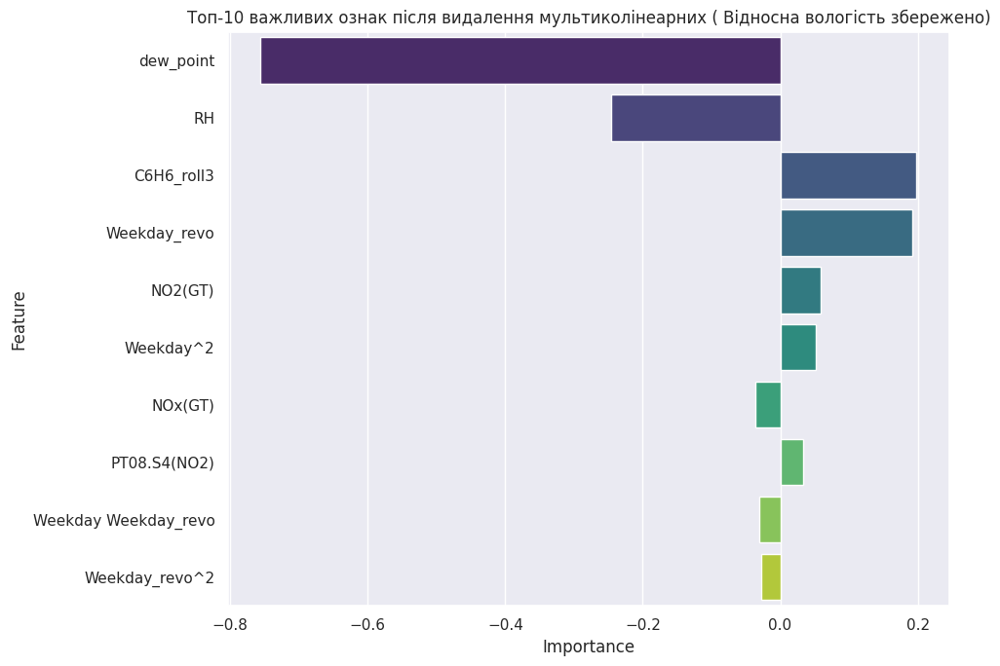

MAE після очищення (з  відносна вологість): 0.869 ± 0.030


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.compose import make_column_transformer, TransformedTargetRegressor
from sklearn.model_selection import RepeatedKFold, cross_val_score


selected_columns = [
    'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)',
    'PT08.S4(NO2)', 'PT08.S5(O3)',
    'RH', 'dew_point',
    'Weekday', 'Weekday_revo',
    'C6H6_roll3', 'C6H6_lag1'
]

corr_matrix = X_df[selected_columns].corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

to_drop = []
threshold = 0.95
for column in upper.columns:
    for row in upper.index:
        if upper.loc[row, column] > threshold:
          to_drop.append(column)

to_drop = list(set(to_drop))
print(" Видаляємо мультиколінеарні ознаки (крім dew_point):", to_drop)

selected_columns_updated = [col for col in selected_columns if col not in to_drop]
X_df_final = X_df[selected_columns_updated]

poly = PolynomialFeatures(degree=2, include_bias=False)
preprocessor = make_column_transformer(
    (poly, X_df_final.columns),
    remainder="passthrough",
    verbose_feature_names_out=False
)

selector = SelectFromModel(LinearRegression(), threshold=0.00001)

model_pipeline = make_pipeline(
    preprocessor,
    selector,
    TransformedTargetRegressor(regressor=LinearRegression())
)

cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(model_pipeline, X_df_final, Y_df,
                         scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)

model_pipeline.fit(X_df_final, Y_df)

feature_names = model_pipeline.named_steps['columntransformer'].get_feature_names_out()
coefs = model_pipeline.named_steps['selectfrommodel'].estimator_.coef_
mask = model_pipeline.named_steps['selectfrommodel'].get_support()

coef_df = pd.DataFrame({
    'Feature': np.array(feature_names)[mask],
    'Importance': coefs[mask]
}).sort_values(by='Importance', key=abs, ascending=False).head(10)

plt.figure(figsize=(10, 7))
sns.barplot(data=coef_df, y='Feature', x='Importance', palette='viridis')
plt.title('Топ-10 важливих ознак після видалення мультиколінеарних')
plt.tight_layout()
plt.grid(True, axis='x')
plt.show()

print(f"MAE після очищення (з  відносна вологість): {np.mean(np.abs(scores)):.3f} ± {np.std(scores):.3f}")


Під час побудови моделі було виявлено мультиколінеарні ознаки за допомогою кореляційної матриці з порогом 0.95. Надмірно корельовані ознаки видалялися, однак RH (відносна вологість) було усвідомлено збережено через її високу значущість у фізичному та статистичному сенсі.

Було застосовано поліноміальне розширення ознак (PolynomialFeatures) для врахування взаємодій та нелінійностей. Надалі, SelectFromModel на основі LinearRegression дозволив залишити лише найбільш інформативні фічі.

Модель перевірено за допомогою Repeated K-Fold Cross-Validation, що дозволило уникнути переобучення. Отримано MAE = 0.869 ± 0.030, що свідчить про високу точність та стабільність.

Ключовий момент — збереження RH та dew_point як важливих показників атмосферного стану, навіть якщо вони потенційно мультиколінеарні, оскільки вони покращують модель як аналітично, так і логічно.